# Import libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#Author: Sanjay Kottapalli, Dana Pe'er lab (kottapas@mskcc.org)

import numpy as np
import numpy.matlib
import pandas as pd
import scanpy as sc
from scanpy.external.pp import magic
import scipy
from sklearn.metrics import adjusted_rand_score
from scipy.stats.mstats import zscore
from scipy.stats import pearsonr
import csv
import os
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from copy import deepcopy
import timeit
from joblib import Parallel, delayed
from collections import Counter
np.random.seed(0)

# Define functions

In [3]:
def import_seqc_data(sample_name, path, dense=True):
    print('\nsample: ' + sample_name)
    if dense:
        PATH_TO_COUNT_CSV = path + sample_name + '_dense.csv'
        # import csv
        raw_counts = pd.read_csv(PATH_TO_COUNT_CSV, index_col=0, header=0)
        print(raw_counts.shape)
        #
        with open(PATH_TO_COUNT_CSV, "r") as f:
            reader = csv.reader(f)
            original_column_names = next(reader)
        # remove the first entry of this list, it belongs to the index column
        gene_names = original_column_names[1:]
        # and label the index column with name 'cell_barcodes'
        raw_counts.index.name = 'cell_barcodes'
        # convert indices to strings instead of integers for compatibility with scanpy
        raw_counts.index = raw_counts.index.astype(str)
        # python automatically converts duplicate column names to numbered column names,
        # e.g. 'X', 'X.1', 'X.2' etc. We can import the original column names from our CSV file:

        # now transpose the dataframe (for compatibility with panda's groupby function), 
        # then group by gene names, and add up the counts for genes with the same name
        raw_counts_transposed = raw_counts.T
        raw_counts_transposed_clean = raw_counts_transposed.groupby(gene_names, axis='index', sort=False).agg('sum')
        # transpose back
        raw_counts_clean = raw_counts_transposed_clean.T
        # if columns were added up, print how many:
        number_of_columns_removed = raw_counts.shape[1] - raw_counts_clean.shape[1]
        if number_of_columns_removed > 0:
            print(str(number_of_columns_removed) + ' columns were each merged with another column that had the same gene name.')
        # remove CLUSTER column:
        if 'CLUSTER' in raw_counts_clean.columns:
            raw_counts_clean.drop(columns='CLUSTER', inplace=True)
        # convert index type to string for compatibility with scanpy
        raw_counts_clean.index = raw_counts_clean.index.astype('str')
        adata = sc.AnnData(X = raw_counts_clean)
    else:
        barcodes = pd.read_csv(path+sample_name+'_sparse_counts_barcodes.csv', index_col=0, header=None)
        barcodes = barcodes[1].values
        barcodes = [str(i) for i in barcodes]
        gene_names = pd.read_csv(path+sample_name+'_sparse_counts_genes.csv', index_col=0, header=None)
        gene_names = gene_names[1].values
        sparse_counts = scipy.io.mmread(path+sample_name+'_sparse_molecule_counts.mtx').tocsc()
        #print("# of bytes: "+str(sparse_counts.data.nbytes))
        print(sparse_counts.shape)
        #sparse_counts = sparse_counts.toarray()#np.array(sparse_counts)
        #print(sparse_counts.shape)
        #raw_counts = pd.DataFrame.sparse.from_spmatrix(data=sparse_counts, index=barcodes, columns=gene_names)
        
        gene_dup = pd.Series(dict(Counter(gene_names)))
        gene_dup = gene_dup[gene_dup>1]
        #print(gene_dup)
        #print(len(set(gene_names)))
        gene_dup = list(gene_dup.keys())
        number_of_columns_removed = len(gene_dup)
        
        # sum of duplicate columns for each duplicate gene
        sum_dict = {i:sparse_counts[:,np.where(gene_names==i)[0]].sum(axis=1) for i in gene_dup}
        dup_index = []
        for i in gene_dup:
            dup_index += list(np.where(gene_names==i)[0])
        #print(sum_dict)
        #print(len(dup_index))
        #for i in sum_dict:
        #    print(sum_dict[i].sum(axis=0))
        
        #print(len(gene_names), sparse_counts.shape)
        keep_index = list(set(range(len(gene_names))) - set(dup_index))
        new_genes = list(gene_names[keep_index])
        new_counts = sparse_counts[:, keep_index]
        #print(len(new_genes), new_counts.shape)
        #print(new_counts.shape, type(new_counts))
        for i in sum_dict.keys():
            #print(sum_dict[i])
            #print(type(new_counts), type(sum_dict[i]))
            new_counts = scipy.sparse.hstack([new_counts, sum_dict[i]])
            new_genes.append(i)
        #print(len(new_genes), new_counts.shape)
        new_counts = new_counts.tocsc()
        print(new_counts.shape)#, type(new_counts))
        
        adata = sc.AnnData(X = new_counts, obs=pd.DataFrame(index=barcodes), var=pd.DataFrame(index=new_genes))
        
        if number_of_columns_removed > 0:
            print(str(number_of_columns_removed) + ' columns were each merged with another column that had the same gene name.')
       # take the min libsize in the dense cells, and 
        
        adata, mito_genes, RB_genes_in_data = qc_metrics(adata)
        # remove high mito frac cells
        cutoff = 20.0
        mito_val = adata.obs['pct_counts_mito']
        #print(mito_val)
        via_cells = mito_val[mito_val<cutoff]
        #print(via_cells)
        adata = adata[via_cells.index, :]
        print(adata.shape)
        
        PATH_TO_COUNT_CSV = path + sample_name + '_dense.csv'
        raw_counts = pd.read_csv(PATH_TO_COUNT_CSV, index_col=0, header=0)
        seqc_cells = [str(i) for i in raw_counts.index]
        libsize = adata.obs['original_total_counts'].sort_values(ascending=False)
        #pd.Series(index=adata.obs.index, data=np.array(np.sum(adata.X, axis=1).flatten())[0], dtype=str).sort_values(ascending=False)
        
        #difference = set(seqc_cells)-set([str(i) for i in libsize.iloc[:len(seqc_cells)+15000].index])
        #print(len(seqc_cells),len(difference))
        #print(seqc_cells[:20])
        #print(libsize.iloc[:20])
        
        adata = adata[libsize.iloc[:len(seqc_cells)+15000].index, :] # all dense cells + 15,000
        adata = sc.AnnData(X = adata.X, obs=pd.DataFrame(index=adata.obs.index), var=pd.DataFrame(index=adata.var.index))
        print(adata.shape)
        print("Cells filtered.")
    
    return adata

In [4]:
def qc_metrics(adata, path_RB=''):
    mito_genes = adata.var_names.str.startswith('MT-')
    adata.var['mito'] = mito_genes
    mito_genes = np.array(adata.var.index)[mito_genes]
    
    path_RB = path_RB+'RB_genes_human'
    with open(path_RB,'r') as file:
        lines = file.readlines()
    RB_genes = [x.rstrip('\n') for x in lines]
    data_genes = list(adata.var.index)
    RB_genes_in_data = set(data_genes).intersection(RB_genes)
    RB_genes_in_data = list(RB_genes_in_data)
    
    adata.var['ribo'] = False
    adata.var.loc[RB_genes_in_data, 'ribo'] = True
    
    sc.pp.calculate_qc_metrics(adata, qc_vars=('mito', 'ribo'), inplace=True)
    adata.obs['original_total_counts'] = adata.obs['total_counts']
    adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])
    print('QC metrics calculated.')
    
    return adata, mito_genes, RB_genes_in_data

In [5]:
def norm_filter(adata, mito_genes, RB_genes_in_data
                , log=True, remove_ribo=True, remove_mito=True, highly_var=False, markers=[]):
    
    adata.layers['raw_counts'] = adata.X
    # filter genes expressed in few cells
    print(adata.shape)
    sc.pp.filter_genes(adata, min_cells = 10)
    print(adata.shape)
    
    # libsize normalize
    if type(adata.X)==np.ndarray:
        med_libsize = np.median(np.sum(adata.X, axis=1))
    else:
        sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        #med_libsize = np.median(sums)
        if min(sums) == 0:
            empty_cells = set(np.where(sums==0)[0])
            print('# of 0-count droplets: '+str(len(empty_cells)))
            all_cells = set(adata.obs.index)
            keep_cells = all_cells-empty_cells
            adata = adata[keep_cells, :]
            sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        med_libsize = np.median(sums)

        print('Median library size: ' + str(med_libsize))

    sc.pp.normalize_total(adata)

    # log transform
    if log:
        adata.X = np.log2(adata.X+0.1) - np.log2(0.1)

        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = adata[:,i].X
            except:
                markers.remove(i)
                print(i)

    else:
        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = np.log2(adata[:,i].X+0.1)
            except:
                markers.remove(i)
                print(i)

    # remove ribosomal genes
    if remove_ribo:
        RB_genes_in_data.append('MALAT1')
        adata = adata[:,[x not in RB_genes_in_data for x in adata.var.index]]
        print(adata.shape)

    # remove mitochondrial genes
    if remove_mito:
        adata = adata[:,[x not in mito_genes for x in adata.var.index]]
        print(adata.shape)

    # highly variable gene selection
    print(highly_var)
    if highly_var:
        if not log:
            print('Im here1')
            sc.pp.highly_variable_genes(adata, layer='raw_counts', flavor='seurat_v3',max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))
            print(adata.shape)
        elif log:
            print('Im here2')
            sc.pp.highly_variable_genes(adata, layer=None, flavor='cell_ranger', max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))

    return adata, markers#adata_unlog, markers

In [6]:
def plot_pca(adata):
    #print("I am in here 1")
    
    print(adata.X)
    try:
        print(adata.shape)
        N = 1000
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    except:
        print(adata.shape) 
        N = min(adata.shape) - 1
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    
    #Plot variance explained
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = adata_new.uns['pca']['variance_ratio']
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Fraction of variance explained')
    plt.title('Fraction of variance explained per PC')
    plt.show()
    
    #Plot cumulative variance
    cml_var_explained = np.cumsum(adata_new.uns['pca']['variance_ratio'])
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = cml_var_explained
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Cumulative fraction of variance explained')
    plt.title('Cumulative fraction of variance explained by PCs')
    plt.show()
    
    return cml_var_explained, adata_new.uns['pca']['variance_ratio']
    
def kneepoint(vec):
    #print("I am in here 4")
    curve =  [1-x for x in vec]
    nPoints = len(curve)
    allCoord = np.vstack((range(nPoints), curve)).T
    np.array([range(nPoints), curve])
    firstPoint = allCoord[0]
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))
    vecFromFirst = allCoord - firstPoint
    scalarProduct = np.sum(vecFromFirst * numpy.matlib.repmat(lineVecNorm, nPoints, 1), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))
    idxOfBestPoint = np.argmax(distToLine)
    
    return idxOfBestPoint
    
def run_pca_knee(adata):
    cml, var = plot_pca(adata)

    knee = kneepoint(var)
    
    print("Knee point: "+str(knee))
    print("Explained variance: " + str(cml[knee]))

    x=list(range(len(cml)))
    plt.plot(x[:5*knee],cml[:5*knee])
    plt.show()

    adata_new = sc.tl.pca(adata, n_comps=knee+1, copy=True)
    sc.pl.pca_loadings(adata_new, components=range(1,4))
    
    return adata_new

In [7]:
def files_MAST(adata, cell_type = '', outdir = ''):
    
    # if directory doesn't exist, create it
    if not os.path.exists('../DEA/' + cell_type):
        os.makedirs('../DEA/' + cell_type)
    
    adata_celltype = deepcopy(adata)
    print(cell_type + '\t'+"Dimensions" + "\t"+ "{}".format(adata_celltype.shape))
    
    # make a dataframe for the expression matrix
    expmat = pd.DataFrame(adata_celltype.X, columns = adata_celltype.var.index, index = adata_celltype.obs.index)

    # make a dataframe for the observation data
    cdata = pd.DataFrame(adata_celltype.obs, columns=adata_celltype.obs.columns, index = adata_celltype.obs.index)
    
    expmat.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv', index=True)
    cdata.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv', index=True)
    
    print("Files written for {}".format(cell_type))

In [8]:
def run_MAST_for_celltype_condition(adata, cell_type):
    start_time = timeit.default_timer()
    MAST = './runMAST_condition.R'
    
    # run 
    files_MAST(adata = adata, cell_type = cell_type)
    
    expmat_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
    cdata_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
    output_file = '../DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_RESULTS.csv" 
    
    print("Running " + MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file )
    
    os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file)
    out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)
    
    return out_str

def run_MAST_for_celltype(adata, cell_type):
    start_time = timeit.default_timer()
    MAST = './runMAST.R'
    
    # run 
    files_MAST(adata = adata, cell_type = cell_type)
    
    expmat_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
    cdata_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
    output_file_cort = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_cort.csv" 
    output_file_bs = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_bs.csv" 
    
    print("Running " + MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " + output_file_bs)
    
    os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " + output_file_bs)
    out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)
    
    return out_str

In [9]:
godsnot_64 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]

# Populate input parameters

In [10]:
# populate from command line
samples = ['1819_C1029_Ctrl_ES_Cort_IGO_10837_23', '1820_C1029_Ctrl_ES_BS_IGO_10856_3', '1821_996_VE_ES_Cort_IGO_10875_6', '1822_996_VE_ES_BS_IGO_10875_7']
indir = '../input/'
outdir = '../output_Nov/'
figures = '../figures/'

In [11]:
adata_oligo = sc.read_h5ad(outdir+'adata_high_var_Oligo_diff_norm_clusters.h5ad')

# Subset Oligo Brainstem & Input original Adata

In [12]:
adata_oligo_BS = adata_oligo.copy()
adata_oligo_BS = adata_oligo_BS[adata_oligo_BS.obs['B_region'].isin(['BrainStem']),:]
adata_oligo_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(4132, 13466)

In [13]:
adata_oligo_BS.obs.Condition.value_counts()

VE         2752
Control    1380
Name: Condition, dtype: int64

In [14]:
broad_clusters = adata_oligo_BS.obs['Condition']
unique_clusters = np.unique(broad_clusters.values)
samples = adata_oligo_BS.obs['Sample ID']
print('Cell counts in each cluster for each sample: ')

for cluster in unique_clusters:
    print('Cluster: '+str(cluster))
    index = broad_clusters[broad_clusters==cluster].index
    count = Counter(samples[index].values)
    print(count)

Cell counts in each cluster for each sample: 
Cluster: Control
Counter({'1820_C1029_Ctrl_ES_BS_IGO_10856_3': 1380})
Cluster: VE
Counter({'1822_996_VE_ES_BS_IGO_10875_7': 2752})


In [15]:
path_to_h5ad_file = outdir+'adata.h5ad'
adata = sc.read_h5ad(path_to_h5ad_file)
print(adata)
# Add a new column describing the sample condition
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Control", "NA")
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "Control", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "VE", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "VE", adata.obs['Condition'])


adata.obs.head()

AnnData object with n_obs × n_vars = 26101 × 22292
    obs: 'Sample ID'


,Sample ID,Condition
cell_barcodes,,
120703436570020_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455227244_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455251884_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455704877_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120718441244516_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control


In [16]:
# Add a new column describing the sample condition
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Cortex", "NA")
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "BrainStem", adata.obs['B_region'])
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "Cortex", adata.obs['B_region'])
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "BrainStem", adata.obs['B_region'])


#adata.obs
# count the number of NAs
sum(pd.isna(adata.obs['B_region']))

0

In [17]:
adata_oligo_BS = adata[adata_oligo_BS.obs.index, :]
adata_oligo_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(4132, 22292)

# Pre-processing

## QC

In [18]:
adata_oligo_BS, mito_genes, RB_genes_in_data = qc_metrics(adata_oligo_BS)
markers = []
if type(adata_oligo_BS.X)==np.ndarray:
    pass
else:
    print(type(adata_oligo_BS.X))
    #print(adata_norm.X.shape)
    adata_oligo_BS.X = adata_oligo_BS.X.toarray()
    #print(adata_norm.X.shape)
adata_oligo_BS.X = pd.DataFrame(data=adata_oligo_BS.X).fillna(0).values

Trying to set attribute `.var` of view, copying.


QC metrics calculated.
<class 'scipy.sparse.csr.csr_matrix'>


In [19]:
adata_oligo_BS.shape

(4132, 22292)

## Normalization

In [20]:
markers = []
adata_oligo_BS, markers = norm_filter(adata_oligo_BS, mito_genes, RB_genes_in_data, markers=[], highly_var=True)
adata_oligo_BS.obs.head()

(4132, 22292)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(4132, 13377)
(4132, 13199)
(4132, 13186)
True
Im here2


Trying to set attribute `.uns` of view, copying.


2000
2000


,Sample ID,Condition,B_region,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,original_total_counts,log10_original_total_counts
cell_barcodes,,,,,,,,,,,,,,,,,,,
126682808839406_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,1065,6.971669,1692.0,7.434258,22.044917,31.560284,43.912530,66.607565,10.0,2.397895,0.591017,21.0,3.091043,1.241135,1692.0,3.228400
133837016655653_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,BrainStem,2291,7.737180,4746.0,8.465268,28.107880,34.091867,42.351454,57.353561,190.0,5.252274,4.003371,42.0,3.761200,0.884956,4746.0,3.676328
160218196928869_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,976,6.884487,1559.0,7.352441,28.223220,36.561899,49.390635,69.467607,0.0,0.000000,0.000000,19.0,2.995732,1.218730,1559.0,3.192846
191215658986269_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,BrainStem,881,6.782192,1457.0,7.284821,28.826356,38.297872,52.024708,73.850377,0.0,0.000000,0.000000,29.0,3.401197,1.990391,1457.0,3.163460
126682836687156_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,1009,6.917706,1580.0,7.365813,24.683544,34.113924,46.772152,67.784810,1.0,0.693147,0.063291,14.0,2.708050,0.886076,1580.0,3.198657


## PCA

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(4132, 13186)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


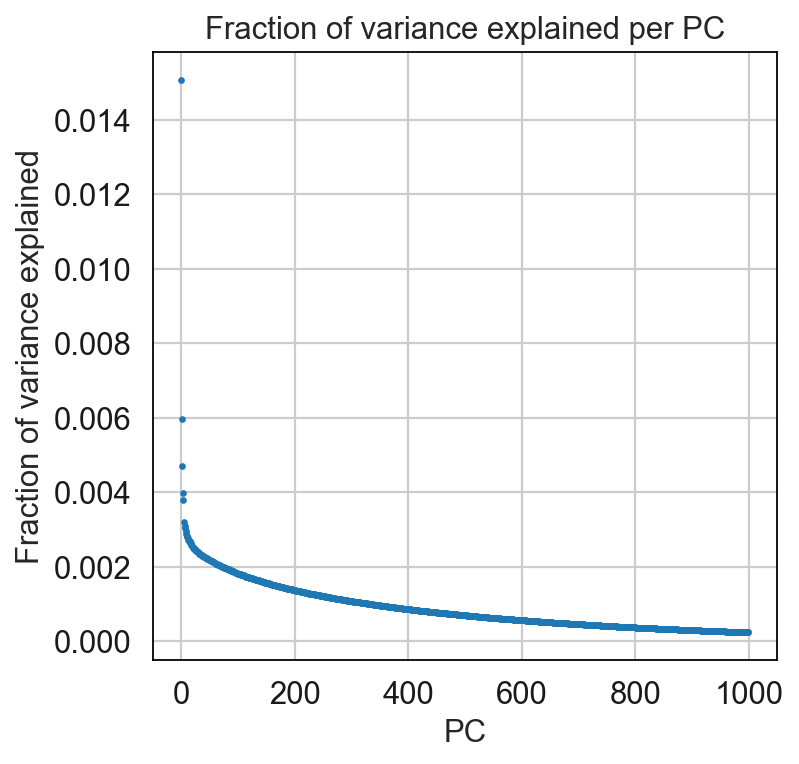

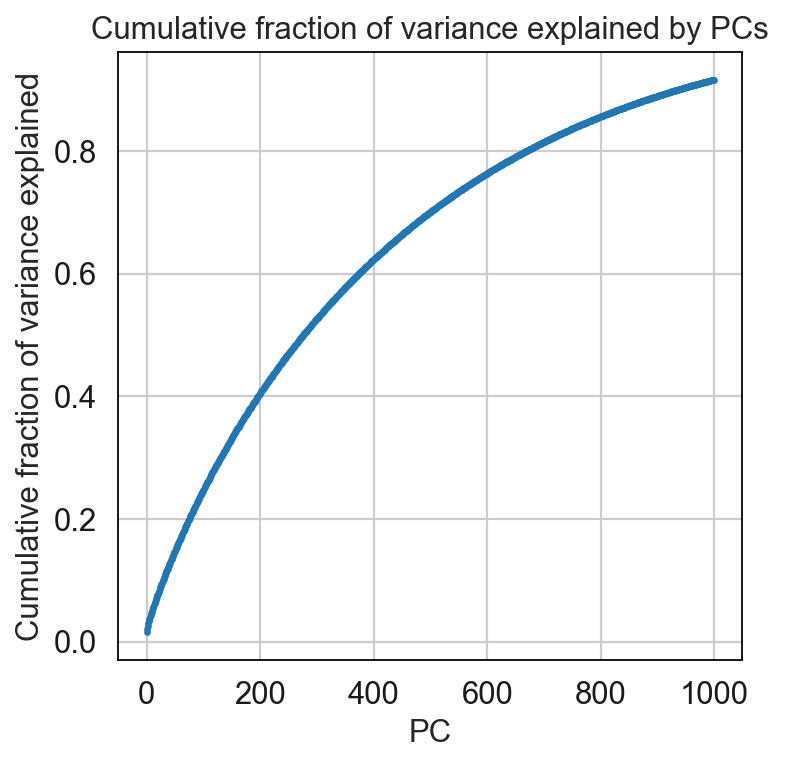

Knee point: 21
Explained variance: 0.08076464


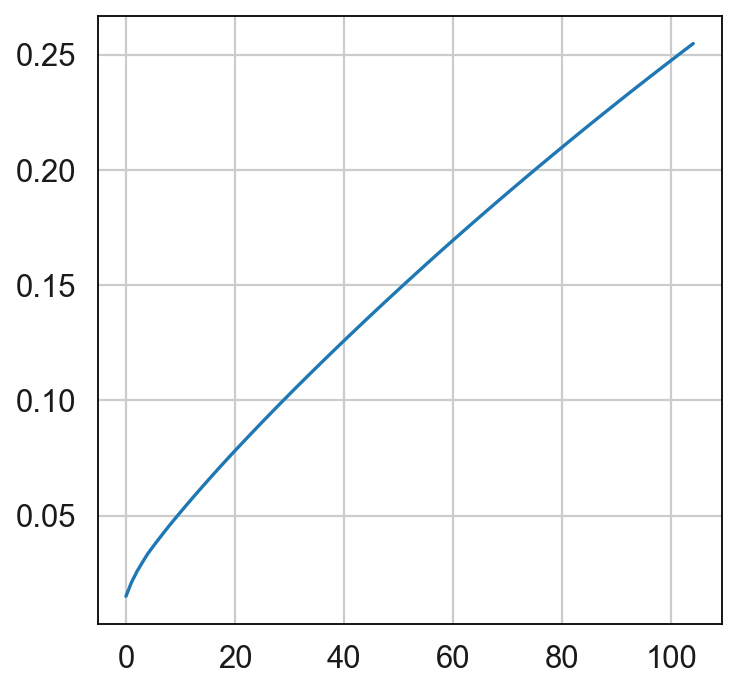

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


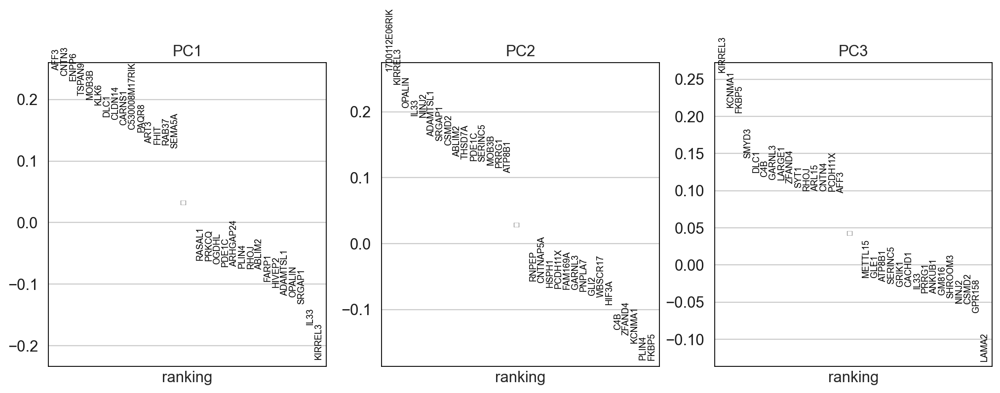

(4132, 13186)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [21]:
sc.set_figure_params(figsize=(5, 5))
adata_oligo_BS = run_pca_knee(adata_oligo_BS)#, 0.5)
adata_oligo_BS.obs['PC 1'] = adata_oligo_BS.obsm['X_pca'][:,0] # optional
adata_oligo_BS.obs['PC 2'] = adata_oligo_BS.obsm['X_pca'][:,1]
adata_oligo_BS.obs['PC 3'] = adata_oligo_BS.obsm['X_pca'][:,2]

print(adata_oligo_BS.shape)
adata_oligo_BS.X = pd.DataFrame(adata_oligo_BS.X).fillna(0).values
index_list = np.arange(adata_oligo_BS.shape[0])
np.random.shuffle(index_list)
adata_oligo_BS = adata_oligo_BS[index_list,:]

In [22]:
print(adata_oligo_BS.shape)
adata_oligo_BS.X = pd.DataFrame(adata_oligo_BS.X).fillna(0).values
index_list = np.arange(adata_oligo_BS.shape[0])
np.random.shuffle(index_list)
adata_oligo_BS = adata_oligo_BS[index_list,:]

(4132, 13186)


## Phenograph

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.30521607398986816 seconds
Jaccard graph constructed in 0.8764128684997559 seconds
Wrote graph to binary file in 0.18041110038757324 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.689485
After 3 runs, maximum modularity is Q = 0.690501
After 13 runs, maximum modularity is Q = 0.692482
Louvain completed 33 runs in 1.534339189529419 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 3.5477471351623535 seconds


Trying to set attribute `.obs` of view, copying.


Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.2758803367614746 seconds
Jaccard graph constructed in 0.9122848510742188 seconds
Wrote graph to binary file in 0.16833209991455078 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.622531
After 2 runs, maximum modularity is Q = 0.626015
After 3 runs, maximum modularity is Q = 0.629089
Louvain completed 23 runs in 1.3859121799468994 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 3.390780210494995 seconds
Finding 20 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3046400547027588 seconds
Jaccard graph constructed in 0.946246862411499 seconds
Wrote graph to binary file in 0.18134093284606934 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.600206
After 6 runs, maximum modularity is Q = 0.601353
After 9 runs, maximum modularity is Q = 0.603073
Louva

Text(0.5, 0, 'k')

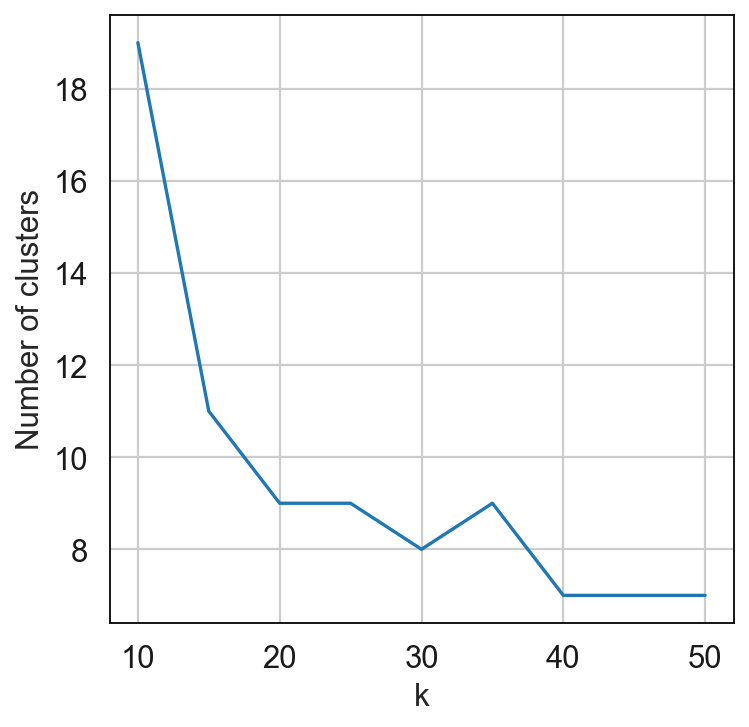

In [23]:
k_list = list(range(10, 55, 5))
n_clusters = []
for k in k_list:
    communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_oligo_BS.obsm['X_pca']),k=k)
    n_clusters.append(len(np.unique(communities)))
    adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS'+str(k)] = pd.Categorical(communities)
    adata_oligo_BS.uns['PhenoGraph_Q_'+str(k)] = Q
    adata_oligo_BS.uns['PhenoGraph_k_'+str(k)] = k
plt.plot(k_list,n_clusters)
plt.ylabel("Number of clusters")
plt.xlabel("k")

In [24]:
Rand_index_df = pd.DataFrame(np.zeros((len(k_list), len(k_list))),index=k_list,columns=k_list)
Rand_index_df.index.name='k1'
Rand_index_df.columns.name='k2'
row_ind = 0
for run1 in range(len(k_list)):
    col_ind = 0
    for run2 in range(len(k_list)):
        Rand_index_df.iloc[row_ind,col_ind] = adjusted_rand_score(
            adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS'+str(k_list[run1])].values,
            adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS'+str(k_list[run2])].values)
        col_ind = col_ind+1
    row_ind = row_ind+1
    

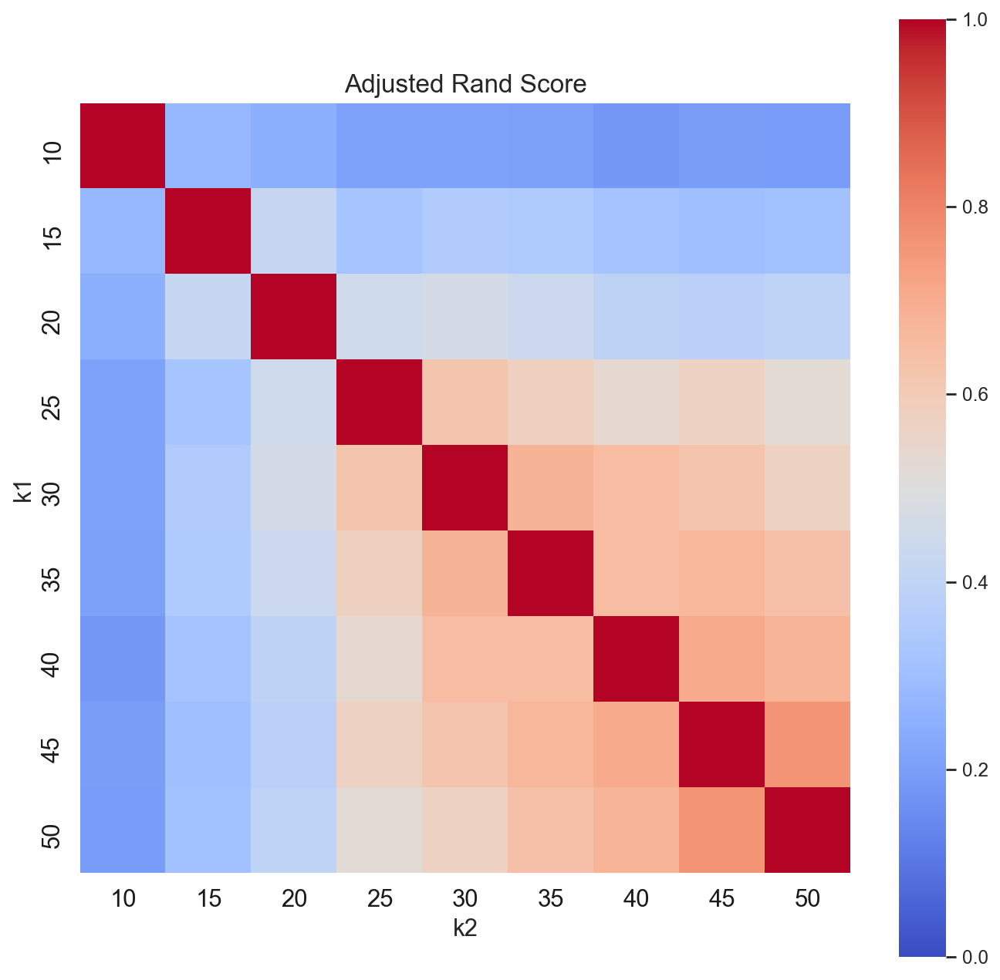

In [25]:
Rand_fig = plt.figure(figsize = (10,10))
plt.xlabel('k1')
plt.ylabel('k2')
plt.title('Adjusted Rand Score',fontsize=15)
sns.set(font_scale=1)
sns.heatmap(Rand_index_df, cmap=('coolwarm'), square=True, vmin=0, vmax=1)
# plt.colorbar(vmin=0)
plt.show();plt.close()


In [25]:
k = 45 # choose k
communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_oligo_BS.obsm['X_pca']),k=k) # run PhenoGraph
adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS'] = pd.Categorical(communities)
adata_oligo_BS.uns['PhenoGraph_Q'] = Q
adata_oligo_BS.uns['PhenoGraph_k'] = k

Finding 45 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.28020691871643066 seconds
Jaccard graph constructed in 1.395716667175293 seconds
Wrote graph to binary file in 0.4810338020324707 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.534939
After 2 runs, maximum modularity is Q = 0.550246
After 5 runs, maximum modularity is Q = 0.553999
Louvain completed 25 runs in 2.6262450218200684 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 5.471414089202881 seconds


# Vizualization & Markers

## Vizualize Oligo BS sub-clusters

In [26]:
sc.set_figure_params(figsize=(8, 8))
sc.pp.neighbors(adata_oligo_BS, method='umap', use_rep='X_pca')
sc.tl.umap(adata_oligo_BS, random_state=None)

... storing 'Condition' as categorical
... storing 'B_region' as categorical


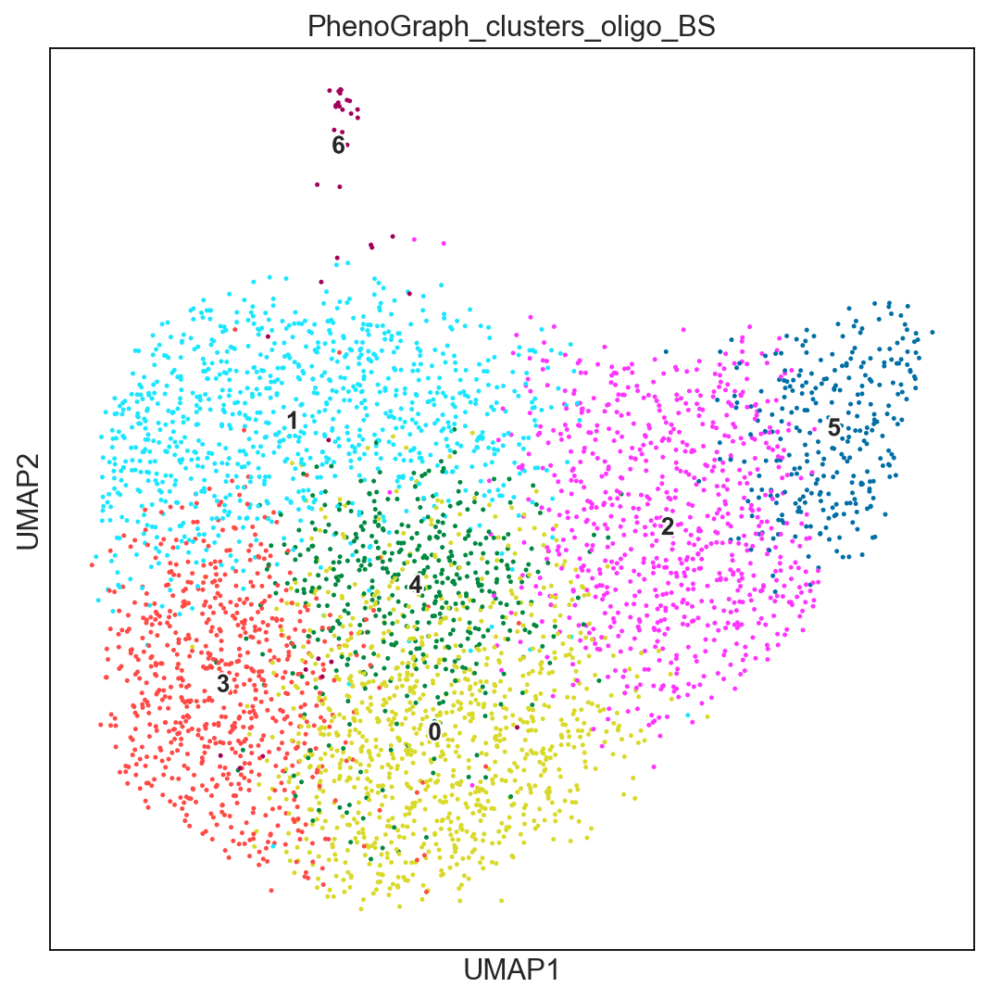

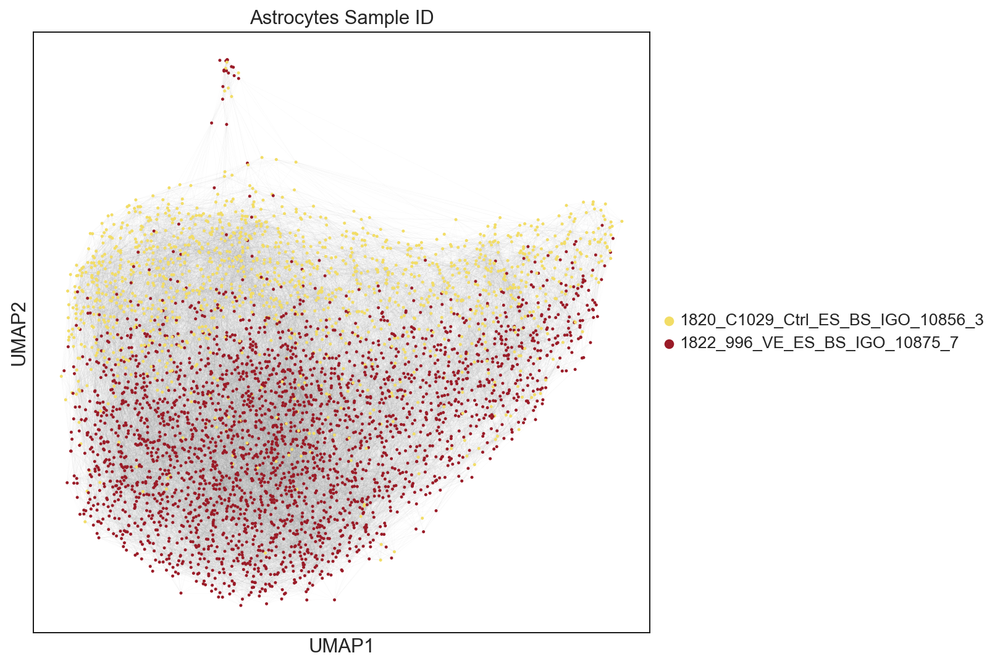

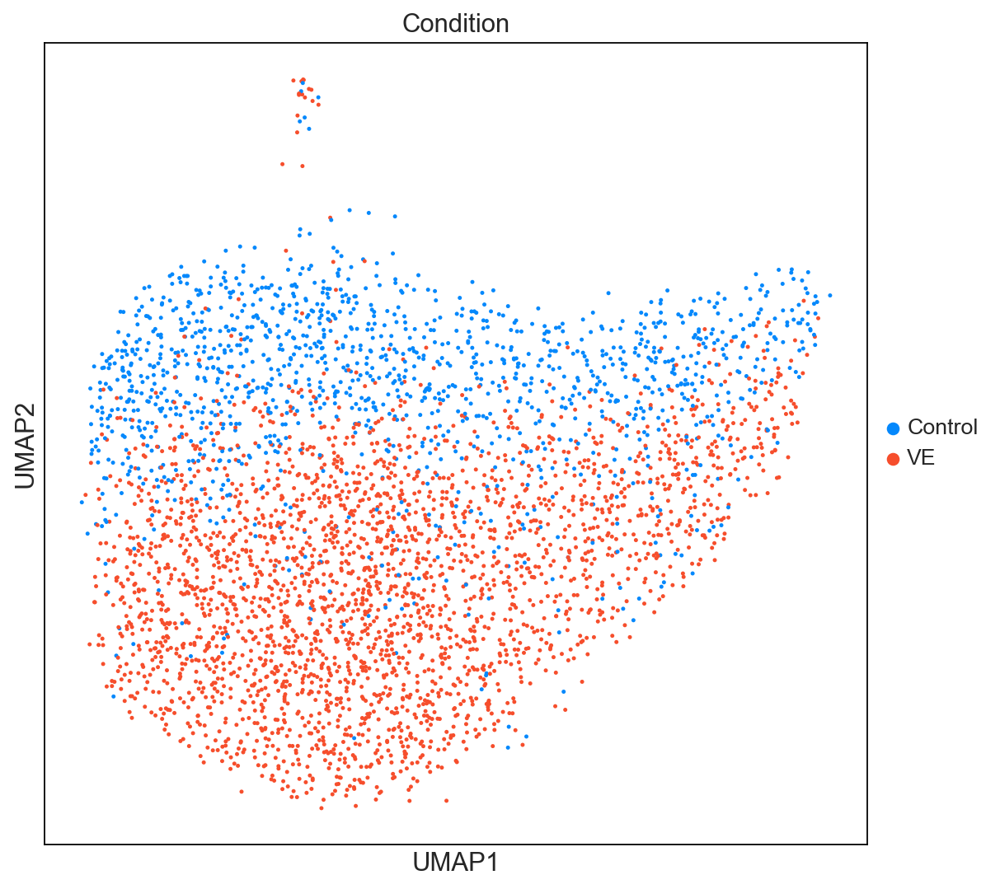

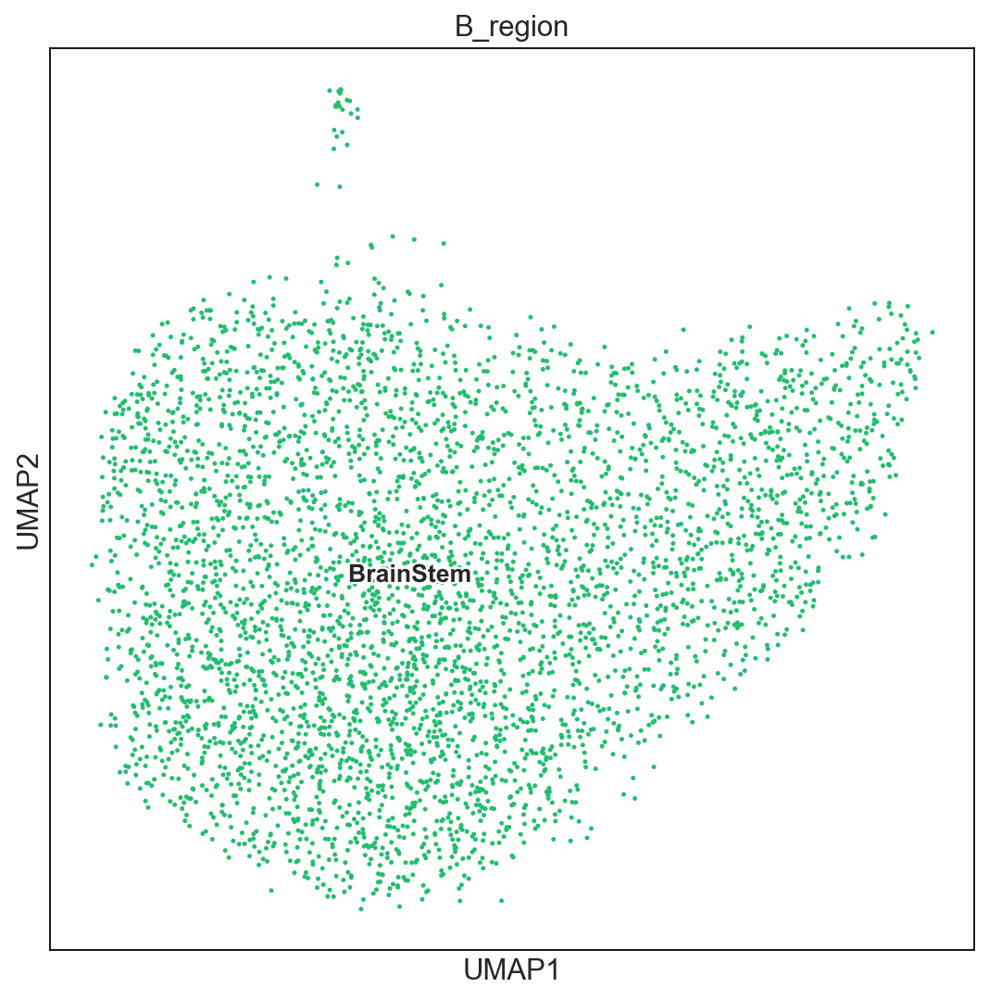

In [27]:
sc.pl.umap(adata_oligo_BS,
           color=['PhenoGraph_clusters_oligo_BS'],
           ncols=2,
           sort_order=False,
           palette=godsnot_64, # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_loc='on data',
           legend_fontsize=12, size = 20,
           legend_fontoutline=2,)

sc.pl.umap(adata_oligo_BS, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#F2DD66", "#9A1B27", "#0359AE", "#14B09B"],
           size=20, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes Sample ID"])

sc.pl.umap(adata_oligo_BS,
           color=['Condition'],
           ncols=2,
           sort_order=False,
           palette=['#0488FC','#F64E2C'], # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_fontsize=12, size = 20,
           legend_fontoutline=2)

sc.pl.umap(adata_oligo_BS,
           color=['B_region'],
           ncols=2,
           sort_order=False,
           palette= ["#22BE6E", "#EDAB13"], # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_loc='on data',
           legend_fontsize=12, size = 20,
           legend_fontoutline=2)



## Find markers (Oligo clusters)

In [28]:
cl_int_to_str = dict()
cl_int_to_str = {
    0 : 'Oligo_BS_0',
    1 : 'Oligo_BS_1',
    2 : 'Oligo_BS_2',
    3 : 'Oligo_BS_3',
    4 : 'Oligo_BS_4',
    5 : 'Oligo_BS_5',
    6 : 'Oligo_BS_6'}

adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS_str'] = adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS'].map(cl_int_to_str).astype('category')

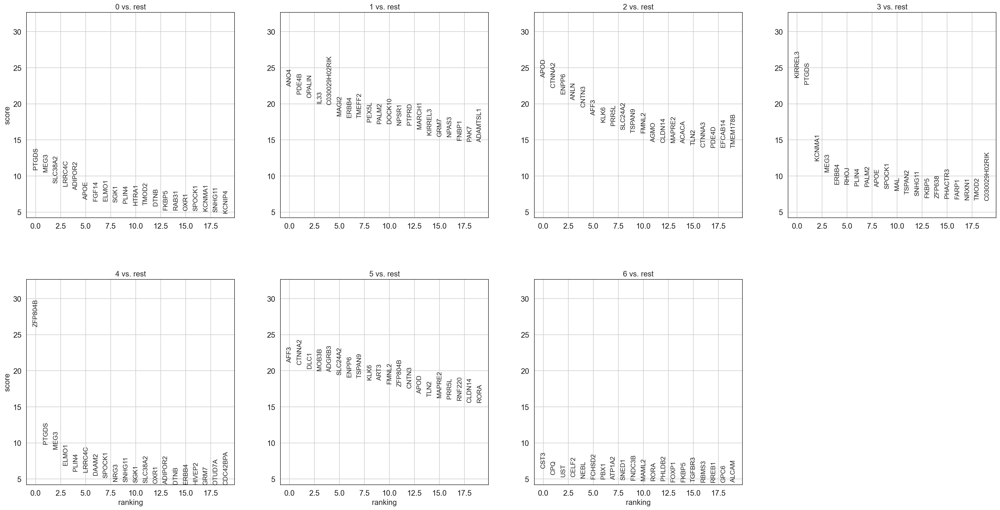

In [29]:
sc.tl.rank_genes_groups(adata_oligo_BS, groupby='PhenoGraph_clusters_oligo_BS', key_added="ranked_genes_pheno_oligo", method='wilcoxon')
sc.pl.rank_genes_groups(adata_oligo_BS, key = 'ranked_genes_pheno_oligo', fontsize=12)

In [30]:
adata_oligo_BS.obs.PhenoGraph_clusters_oligo_BS_str.value_counts()

Oligo_BS_0    981
Oligo_BS_1    937
Oligo_BS_2    753
Oligo_BS_3    677
Oligo_BS_4    460
Oligo_BS_5    286
Oligo_BS_6     38
Name: PhenoGraph_clusters_oligo_BS_str, dtype: int64

In [31]:
adata_oligo_BS.obs.PhenoGraph_clusters_oligo_BS_str.value_counts()

Oligo_BS_0    981
Oligo_BS_1    937
Oligo_BS_2    753
Oligo_BS_3    677
Oligo_BS_4    460
Oligo_BS_5    286
Oligo_BS_6     38
Name: PhenoGraph_clusters_oligo_BS_str, dtype: int64

## Visualize marker genes using heatmap

In [32]:
adata_oligo_BS.layers['scaled'] = sc.pp.scale(adata_oligo_BS, copy=True).X

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'heatmap_ax': <AxesSubplot:>,
 'groupby_ax': <AxesSubplot:xlabel='PhenoGraph_clusters_oligo_BS_str'>,
 'dendrogram_ax': <AxesSubplot:>,
 'gene_groups_ax': <AxesSubplot:>}

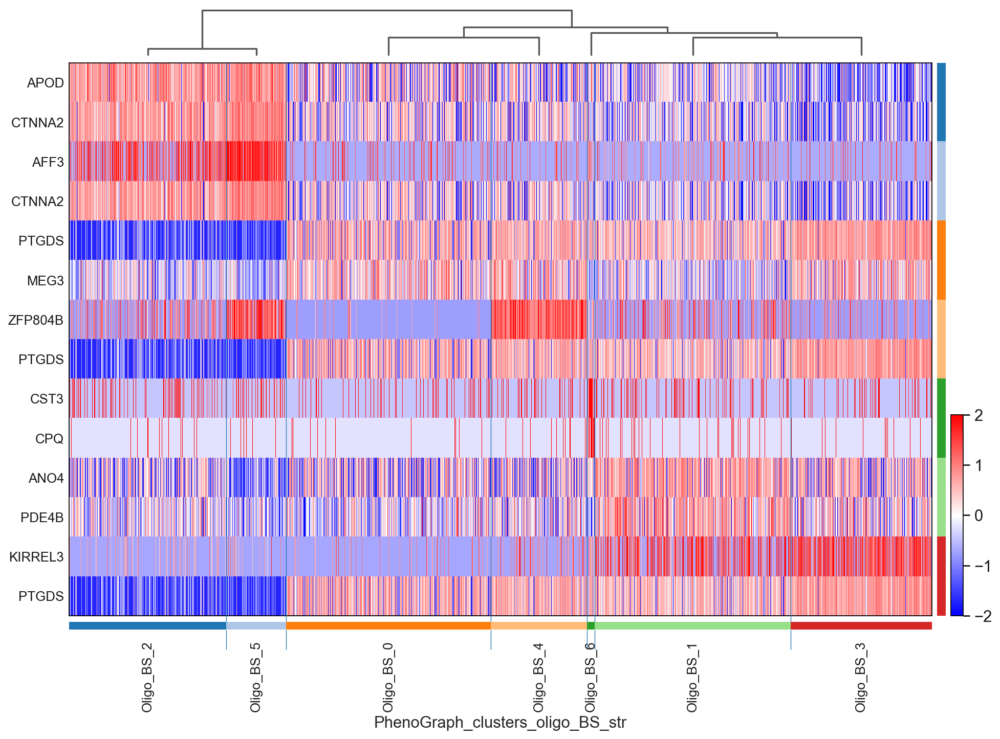

In [199]:
sc.set_figure_params(figsize=(8, 8))
sc.tl.rank_genes_groups(adata_oligo_BS, groupby='PhenoGraph_clusters_oligo_BS_str', n_genes=adata_oligo_BS.shape[1], method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(adata_oligo_BS, n_genes=2, use_raw=False, swap_axes=True, vmin=-2, vmax=2, cmap='bwr', layer='scaled', figsize=(14,10), show=False)

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


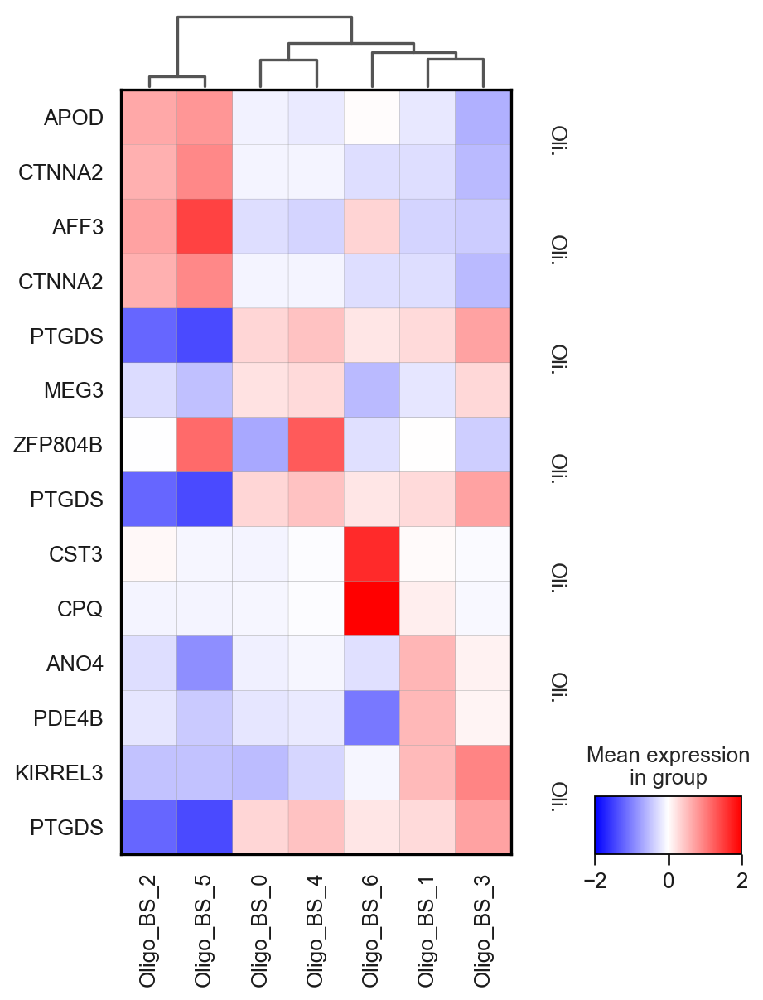

In [200]:
sc.pl.rank_genes_groups_matrixplot(adata_oligo_BS, n_genes=2, use_raw=False, swap_axes=True, vmin=-2, vmax=2, cmap='bwr', layer='scaled', figsize=(6,8))

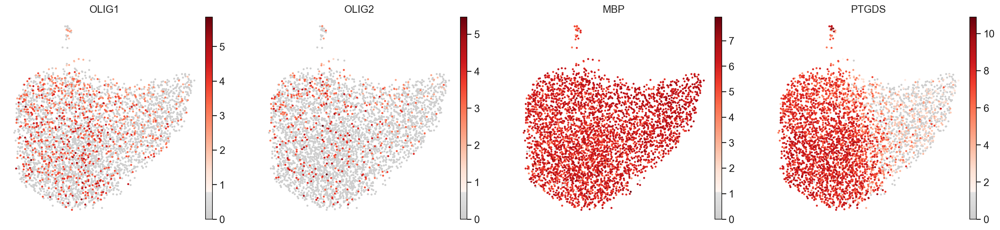

In [34]:
sc.set_figure_params(figsize=(5, 5))
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
 
sc.pl.umap(adata_oligo_BS,
           size = 30,
           color=['OLIG1','OLIG2','MBP','PTGDS'],
           color_map=mymap,
          frameon=False, )

**PTGDS expression**

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


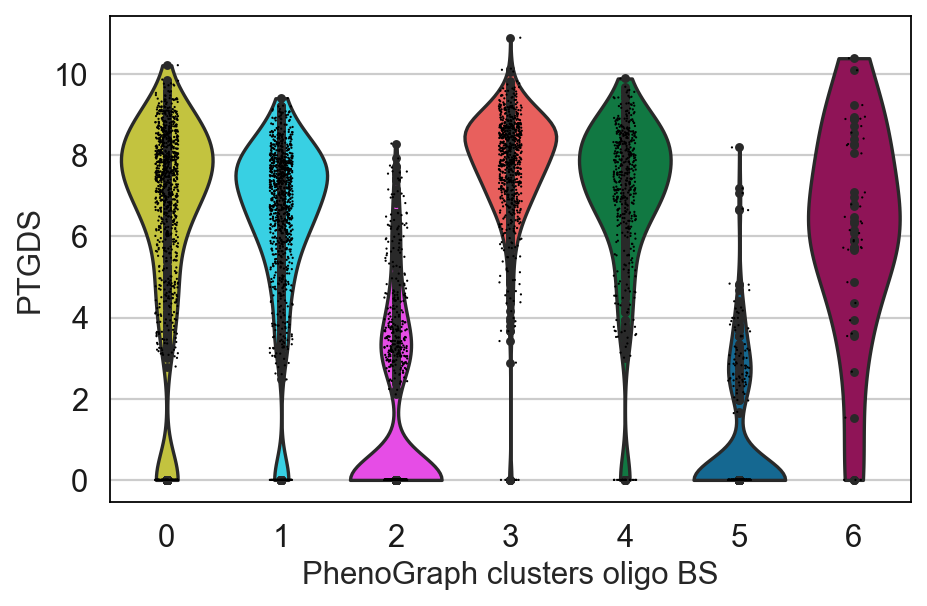

In [36]:
sc.set_figure_params(figsize=(6, 4))
sc.pl.violin(adata_oligo_BS, ['PTGDS'], groupby='PhenoGraph_clusters_oligo_BS', inner='point', palette = godsnot_64)

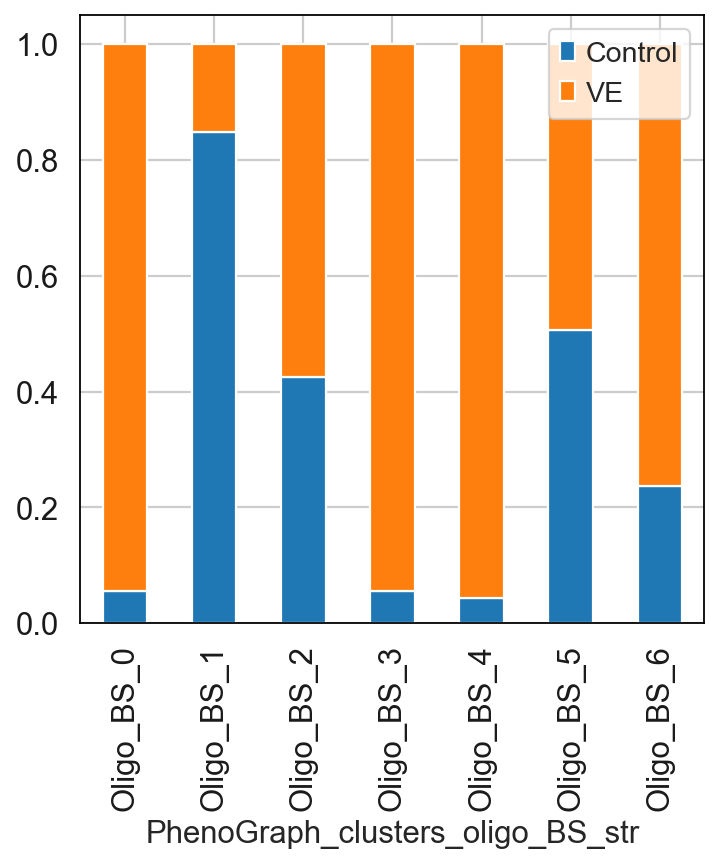

In [201]:
sc.set_figure_params(figsize=(5, 5))
tmp = pd.crosstab(adata_oligo_BS.obs['PhenoGraph_clusters_oligo_BS_str'],adata_oligo_BS.obs['Condition'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper right')


# Save result Adata Oligodendrocytes

In [37]:
#adata_oligo_BS.write_h5ad(outdir+'adata_high_var_Oligo_Brainstem_clusters.h5ad')

Load the adata object that holds the latest cell type annotations..

In [11]:
adata_oligo_BS = sc.read_h5ad(outdir+'adata_high_var_Oligo_Brainstem_clusters.h5ad')

# Differential expression with MAST (BS ALL samples)

Oligodendrocytes Brainstem clusters only

In [42]:
run_MAST_for_celltype_condition(adata_oligo_BS, "Oligodendrocytes")

Oligodendrocytes	Dimensions	(4132, 13186)
Files written for Oligodendrocytes
Running ./runMAST_condition.R ../DEA/Oligodendrocytes/adata_Oligodendrocytes_exp_mat.csv ../DEA/Oligodendrocytes/adata_Oligodendrocytes_cdata.csv ../DEA/Oligodendrocytes/MAST_DEA_Oligodendrocytes_RESULTS.csv


'Finished running MAST on( Oligodendrocytes) in 583.0220444840002 seconds.'

In [12]:
# import the MAST results
adata_oligo_BS_res = pd.read_csv (filepath_or_buffer= '../DEA/Oligodendrocytes_Brainstem/MAST_DEA_Oligodendrocytes_RESULTS.csv')
print(adata_oligo_BS_res)

         gene              p      p.fdr.adj     logFC
0      TMEFF2  4.564747e-112  6.019076e-108 -0.820740
1       FKBP5  1.166821e-108  7.692853e-105  1.245794
2       PTPRD  2.556213e-108  1.123541e-104 -0.646317
3       FNBP1  4.619714e-108  1.522889e-104 -0.974108
4       PDE4B  1.321432e-107  3.484881e-104 -0.622048
...       ...            ...            ...       ...
13181   DDX11   9.995378e-01   9.997807e-01 -0.000213
13182  ZFP689   9.995532e-01   9.997807e-01  0.000182
13183   LYRM5   9.996456e-01   9.997972e-01 -0.000006
13184  P2RY12   9.999224e-01   9.999983e-01  0.000032
13185  RIIAD1   1.000000e+00   1.000000e+00 -0.000083

[13186 rows x 4 columns]


In [13]:
 adata_oligo_BS_res[adata_oligo_BS_res['p.fdr.adj'] <= 0.05]

,gene,p,p.fdr.adj,logFC
0,TMEFF2,4.564747e-112,6.019076e-108,-0.820740
1,FKBP5,1.166821e-108,7.692853e-105,1.245794
2,PTPRD,2.556213e-108,1.123541e-104,-0.646317
3,FNBP1,4.619714e-108,1.522889e-104,-0.974108
4,PDE4B,1.321432e-107,3.484881e-104,-0.622048
...,...,...,...,...
4664,CTPS2,1.757775e-02,4.968493e-02,0.015214
4665,MDFIC,1.760417e-02,4.974895e-02,0.016055
4666,KDM8,1.763702e-02,4.983109e-02,-0.039314
4667,MPV17,1.766207e-02,4.989118e-02,0.039784


In [90]:
#filter DE results
adata_oligo_BS_res = adata_oligo_BS_res.sort_values(by='logFC', ascending=False)
# Upregulated genes
adata_oligo_BS_res_UP = adata_oligo_BS_res[(adata_oligo_BS_res['logFC'] >=0.5) & (adata_oligo_BS_res['p.fdr.adj'] <= 0.05)]
adata_oligo_BS_res_DOWN = adata_oligo_BS_res[(adata_oligo_BS_res['logFC'] <= -0.5) & (adata_oligo_BS_res['p.fdr.adj'] <= 0.05)]
#mast_C0_res_UP['gene'].head(20)
adata_oligo_BS_res_UP.head(10)

,gene,p,p.fdr.adj,logFC
7,SGK3,1.647403e-91,2.715333e-88,1.338528
13,DTNB,3.349377e-82,3.154635e-79,1.285887
1,FKBP5,1.166821e-108,7.692853e-105,1.245794
10,ACACA,2.336704e-90,2.801070e-87,1.195540
19,CAMK1D,7.262358e-74,4.788073e-71,1.114371
23,HTRA1,1.336180e-68,7.341194e-66,1.085080
8,ADIPOR2,1.177258e-90,1.552346e-87,1.053155
9,PLIN4,1.177268e-90,1.552346e-87,1.029232
18,ZFAND4,1.115028e-74,7.738298e-72,0.975810
69,ANLN,1.210737e-34,2.280683e-32,0.965565


**FOR GO**

In [97]:
adata_oligo_BS_res_UP_for_GO = adata_oligo_BS_res[(adata_oligo_BS_res['p.fdr.adj'] <= 0.05) & (adata_oligo_BS_res['logFC'] >=0.05)]
adata_oligo_BS_res_DOWN_for_GO = adata_oligo_BS_res[(adata_oligo_BS_res['p.fdr.adj'] <= 0.05) & (adata_oligo_BS_res['logFC'] <=-0.05)]

## Volcano plot

In [250]:
from bioinfokit import analys, visuz

In [251]:
adata_oligo_BS_res = adata_oligo_BS_res.dropna()

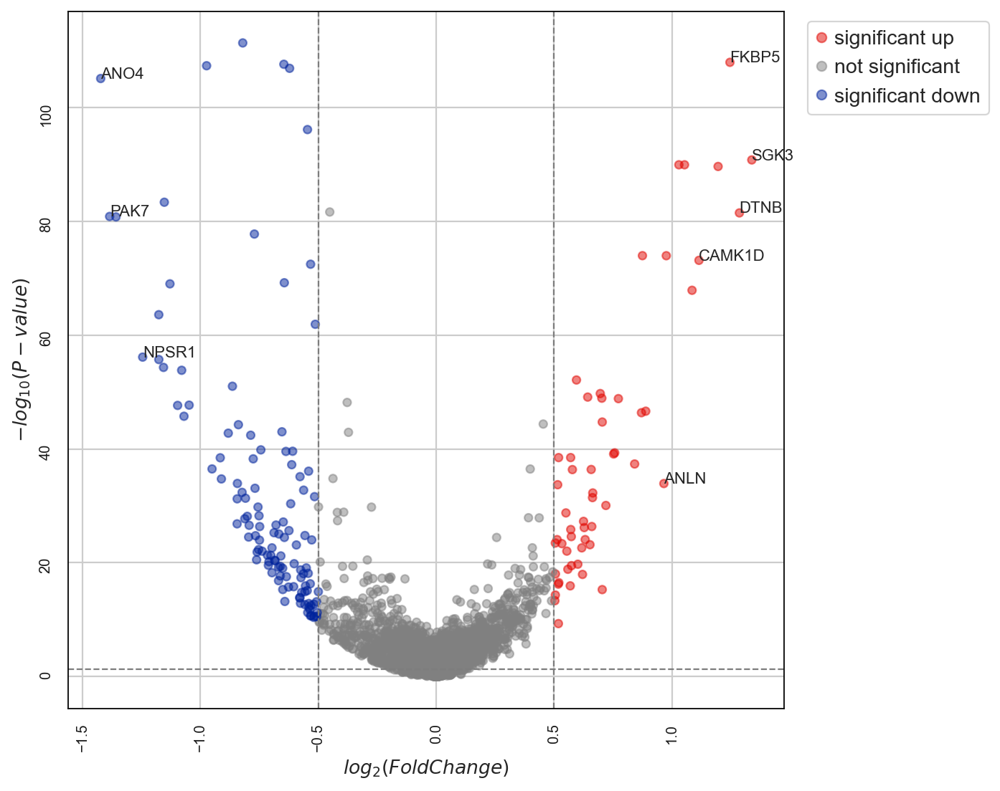

In [260]:
visuz.gene_exp.volcano(df=adata_oligo_BS_res, lfc='logFC', pv='p',show=True, plotlegend=True, legendpos='upper right', 
    legendanchor=(1.3,1),color=("#E10600FF", "grey", "#00239CFF"), valpha=0.5, dotsize=25, geneid="gene", 
                       genenames=('SGK3', 'DTNB', 'FKBP5', 'CAMK1D','ANLN','ANO4','PAK7','NPSR1'),  sign_line=True, gfont = 10, dim=(8,8), axlabelfontsize = 12, lfc_thr=(0.5, 0.5))

## ALL clusters Enrichr 

In [101]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
import gseapy
gene_set_names = gseapy.get_library_name(database='Mouse')
#print(gene_set_names)

adata_oligo_BS_res_UP_n_list = adata_oligo_BS_res_DOWN_for_GO.gene.str.strip().tolist()
enr_res = gseapy.enrichr(gene_list=adata_oligo_BS_res_UP_n_list,
                     organism='Mouse',
                     gene_sets=['KEGG_2019_Mouse'],
                     description='pathway',
                     cutoff = 0.5)

In [102]:
enr_res.results.head(10)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Mouse,Axon guidance,32/180,4.809709e-08,0.000014,0,0,3.369897,56.782915,SEMA5A;ITGB1;GSK3B;LRRC4;PARD6G;PIK3R1;PRKCZ;R...
1,KEGG_2019_Mouse,Glutamatergic synapse,21/114,5.276478e-06,0.000744,0,0,3.497566,42.503302,TRPC1;SLC1A2;SLC1A3;GRIK4;PRKCA;GRIK1;GRIK2;PL...
2,KEGG_2019_Mouse,Steroid biosynthesis,7/19,8.423188e-05,0.006288,0,0,8.970423,84.159949,SQLE;SC5D;DHCR24;MSMO1;DHCR7;CYP51;FDFT1
3,KEGG_2019_Mouse,Adrenergic signaling in cardiomyocytes,22/148,1.011523e-04,0.006288,0,0,2.701930,24.854738,ATF2;ATF6B;CACNA2D3;ATP1A3;PPP2R2A;PRKCA;ATP1A...
4,KEGG_2019_Mouse,Endocytosis,33/269,1.162281e-04,0.006288,0,0,2.170886,19.668133,WIPF1;SH3KBP1;VPS4B;CLTC;AGAP1;PARD6G;ASAP1;PL...
5,KEGG_2019_Mouse,MAPK signaling pathway,35/294,1.337770e-04,0.006288,0,0,2.098903,18.720818,ATF2;IL1RAP;DUSP16;RELA;STK3;IKBKB;PAK1;RPS6KA...
6,KEGG_2019_Mouse,Sphingolipid signaling pathway,19/124,1.963808e-04,0.007542,0,0,2.796373,23.868318,MAP2K2;ASAH2;SGMS1;PTEN;PPP2R2A;PRKCA;PIK3R1;G...
7,KEGG_2019_Mouse,Gap junction,15/86,2.139713e-04,0.007542,0,0,3.260006,27.545967,MAP2K2;LPAR1;HTR2C;PRKCA;TUBB4A;TJP1;GRM5;TUBB...
8,KEGG_2019_Mouse,Fc gamma R-mediated phagocytosis,15/87,2.441153e-04,0.007649,0,0,3.214556,26.738257,GSN;PRKCA;ASAP1;GAB2;PIK3R1;PLD1;PAK1;BIN1;CFL...
9,KEGG_2019_Mouse,Bacterial invasion of epithelial cells,13/74,5.152850e-04,0.012053,0,0,3.284846,24.868882,ITGB1;SHC4;CLTC;PIK3R1;ACTB;PTK2;ACTG1;CD2AP;D...


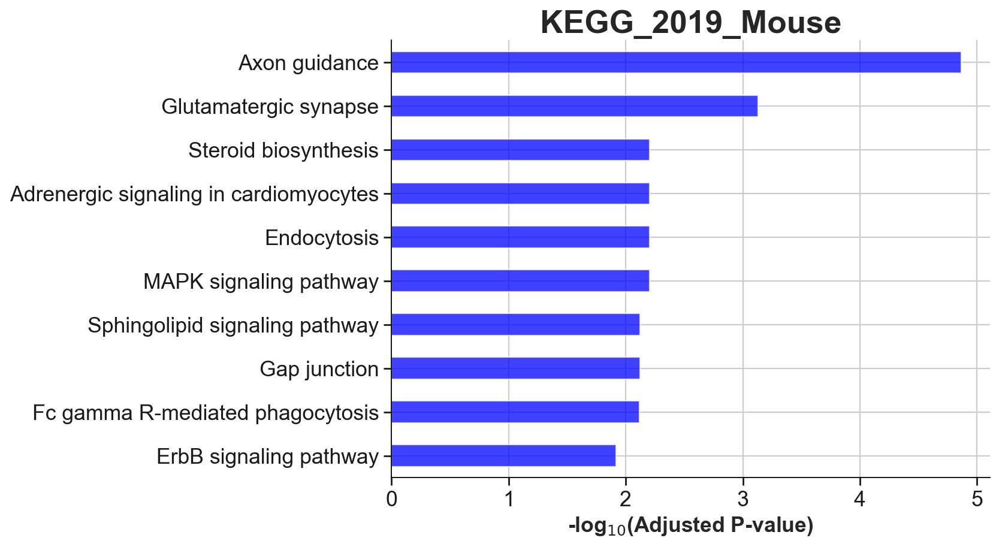

In [103]:
sc.set_figure_params(figsize=(8, 8))
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Mouse',top_term=10,color='blue',figsize=(8,6))

## Heatmaps of gene expression of top DEA genes

### All Brainstem samples

In [16]:
top2_per_cluster= np.array([
'PTGDS',
"MEG3",
'ANO4',
'PDE4B',
"APOD",
'CTNNA2',
'KIRREL3',
'ZFP804B','PTGDS','AFF3','CTNNA2','CST3','CPQ'])
top2_per_cluster = pd.Series(data=top2_per_cluster)


to_plot = pd.concat([top2_per_cluster, adata_oligo_BS_res_UP['gene'].head(20)])

In [17]:
marker_genes_dict = dict()

marker_genes_dict = {'Oligo-BS': to_plot}

categories: Oligo_BS_0_Control, Oligo_BS_0_VE, Oligo_BS_1_Control, etc.
var_group_labels: Oligo-BS


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


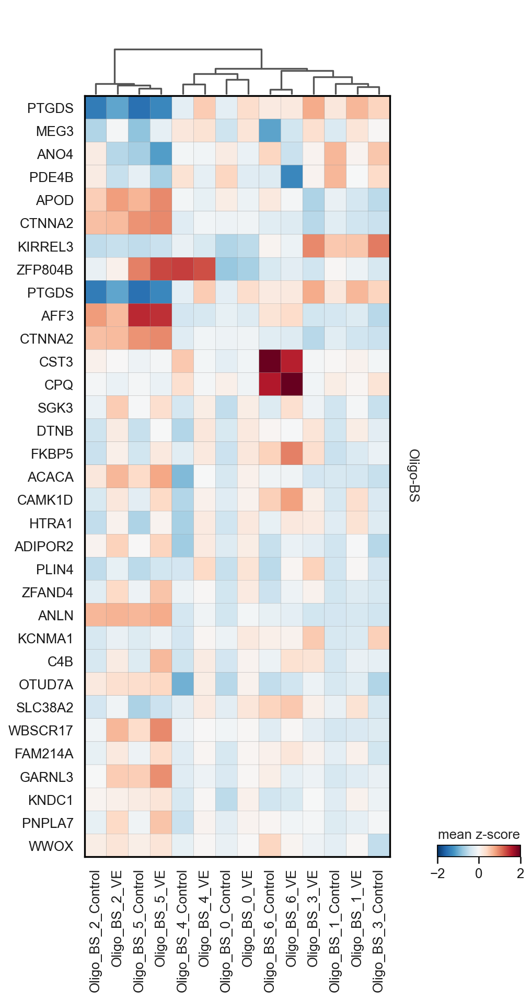

categories: Oligo_BS_0_Control, Oligo_BS_0_VE, Oligo_BS_1_Control, etc.
var_group_labels: Oligo-BS


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


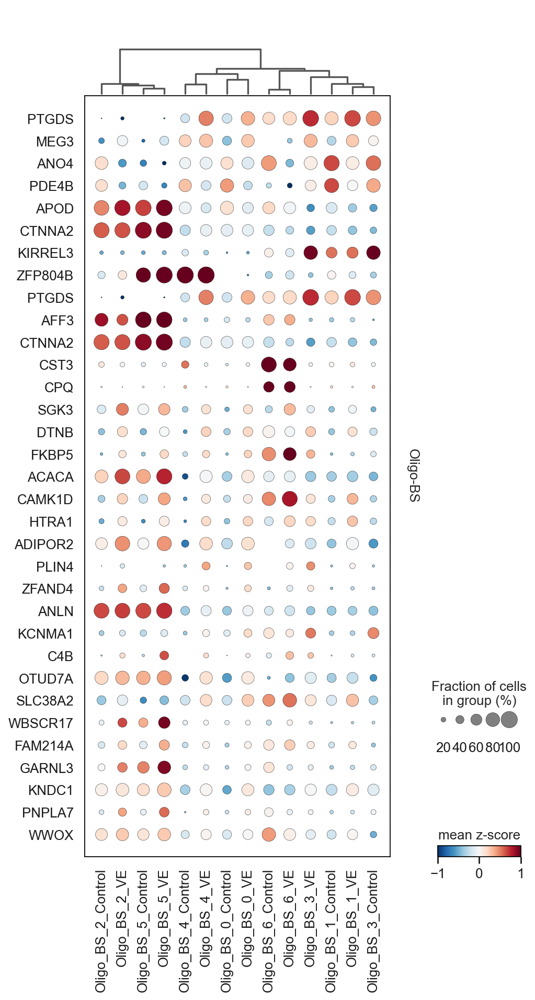

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


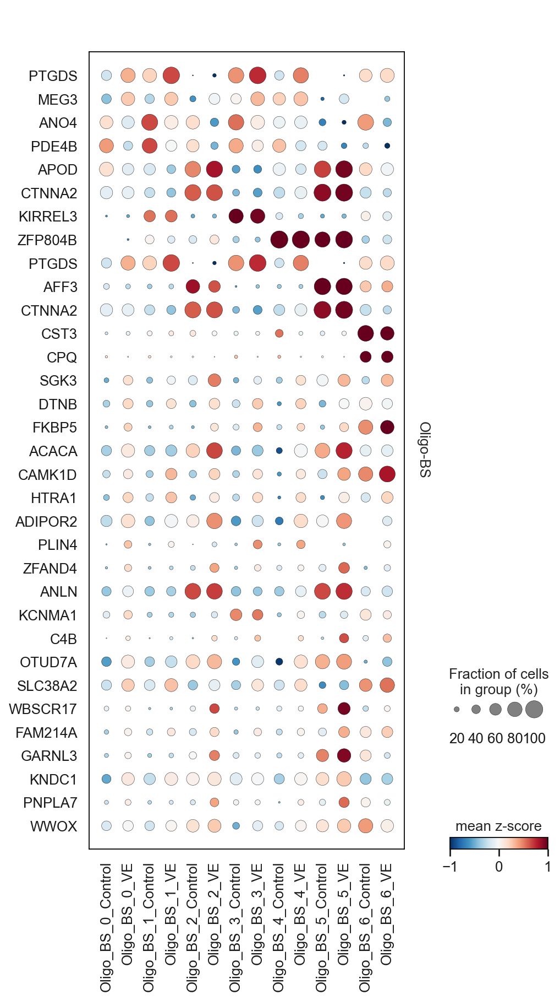

In [19]:
sc.set_figure_params(figsize=(8, 8))
adata_oligo_BS.layers['scaled'] = sc.pp.scale(adata_oligo_BS, copy=True).X
sc.pl.matrixplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=True,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

In [ ]:
sc.set_figure_params(figsize=(6, 4))
sc.pl.violin(adata_oligo_BS, ['PTGDS'], groupby='PhenoGraph_clusters_oligo_str', inner='point', palette = godsnot_64)

# Oligodendrocytes BS control 

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


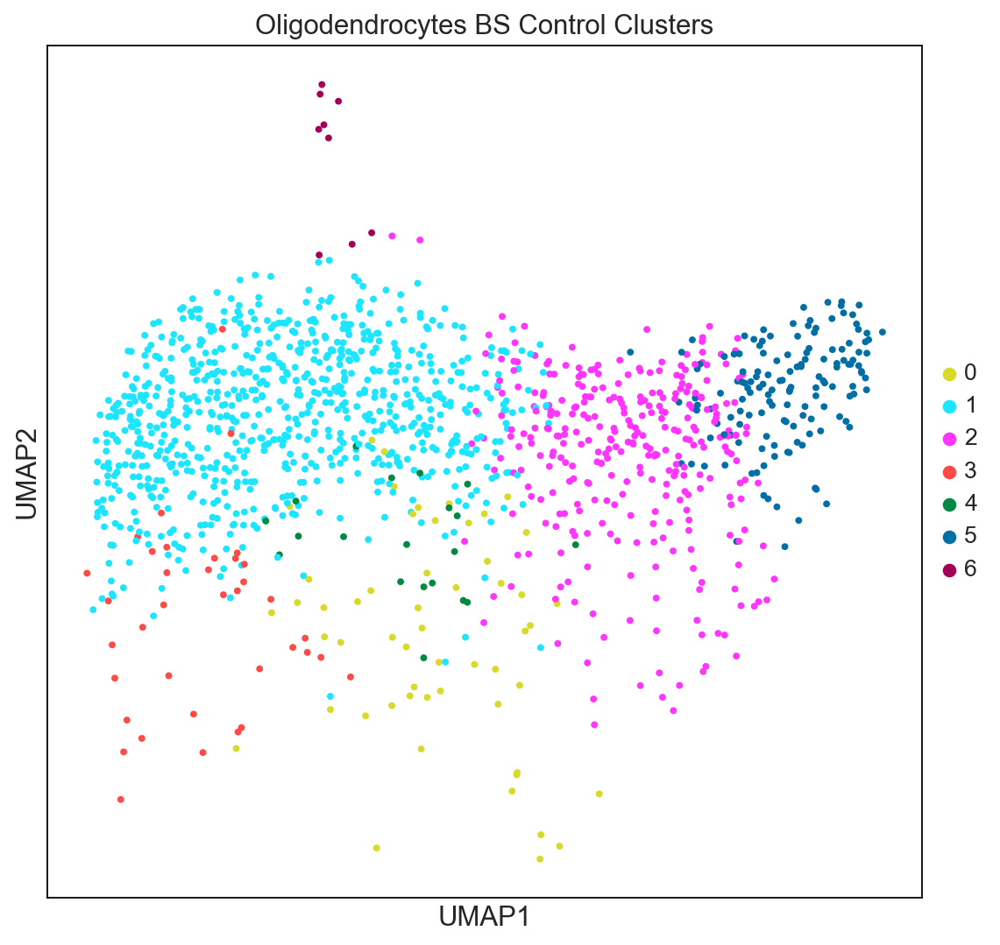

In [61]:
adata_oligo_BS_control = adata_oligo_BS[adata_oligo_BS.obs['Condition'].isin(['Control']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_BS_control, 
           color= ['PhenoGraph_clusters_oligo_BS'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=godsnot_64,
           size=50, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes BS Control Clusters"])

In [62]:
cell_counts_per_cluster_BS_ctrl = adata_oligo_BS_control.obs.PhenoGraph_clusters_oligo_BS.value_counts()
cell_counts_per_cluster_BS_ctrl = cell_counts_per_cluster_BS_ctrl.to_frame()
cell_counts_per_cluster_BS_ctrl

,PhenoGraph_clusters_oligo_BS
1,795
2,320
5,145
0,54
3,37
4,20
6,9


# Oligodendrocytes BS VE

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


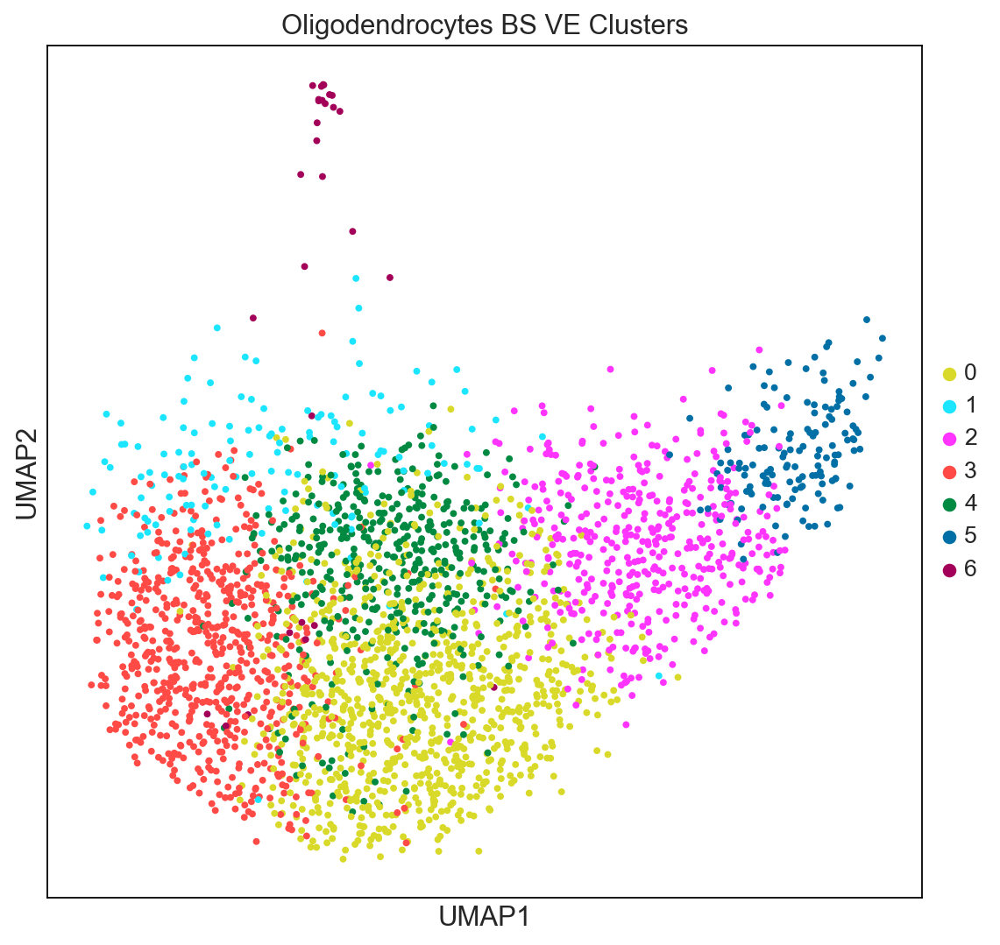

In [63]:
adata_oligo_BS_VE = adata_oligo_BS[adata_oligo_BS.obs['Condition'].isin(['VE']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_oligo_BS_VE, 
           color= ['PhenoGraph_clusters_oligo_BS'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=godsnot_64,
           size=50, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Oligodendrocytes BS VE Clusters"])

In [64]:
cell_counts_per_cluster_BS_VE = adata_oligo_BS_VE.obs.PhenoGraph_clusters_oligo_BS.value_counts()
cell_counts_per_cluster_BS_VE = cell_counts_per_cluster_BS_VE.to_frame()
cell_counts_per_cluster_BS_VE

,PhenoGraph_clusters_oligo_BS
0,927
3,640
4,440
2,433
1,142
5,141
6,29


# Make a grouped bar plot of the number of cells per cluster per condition

**Brainstem**

In [65]:
# First merge the 2 data frames by indeces
mergedDF= cell_counts_per_cluster_BS_ctrl.merge(cell_counts_per_cluster_BS_VE, left_index=True, right_index=True, suffixes=('_Control', '_VE'),how = 'outer')
mergedDF.rename(columns = {'PhenoGraph_clusters_oligo_BS_Control' : 'Control', 'PhenoGraph_clusters_oligo_BS_VE' : 'VE'}, inplace = True)
mergedDF

,Control,VE
0,54,927
1,795,142
2,320,433
3,37,640
4,20,440
5,145,141
6,9,29


In [66]:
mergedDF = mergedDF.reset_index()
mergedDF = mergedDF.melt(id_vars=["index"])
mergedDF.rename(columns = {'index' : 'ClusterID', 'variable' : 'Condition', 'value' : 'N_cells'}, inplace = True)
mergedDF

,ClusterID,Condition,N_cells
0,0,Control,54
1,1,Control,795
2,2,Control,320
3,3,Control,37
4,4,Control,20
5,5,Control,145
6,6,Control,9
7,0,VE,927
8,1,VE,142
9,2,VE,433


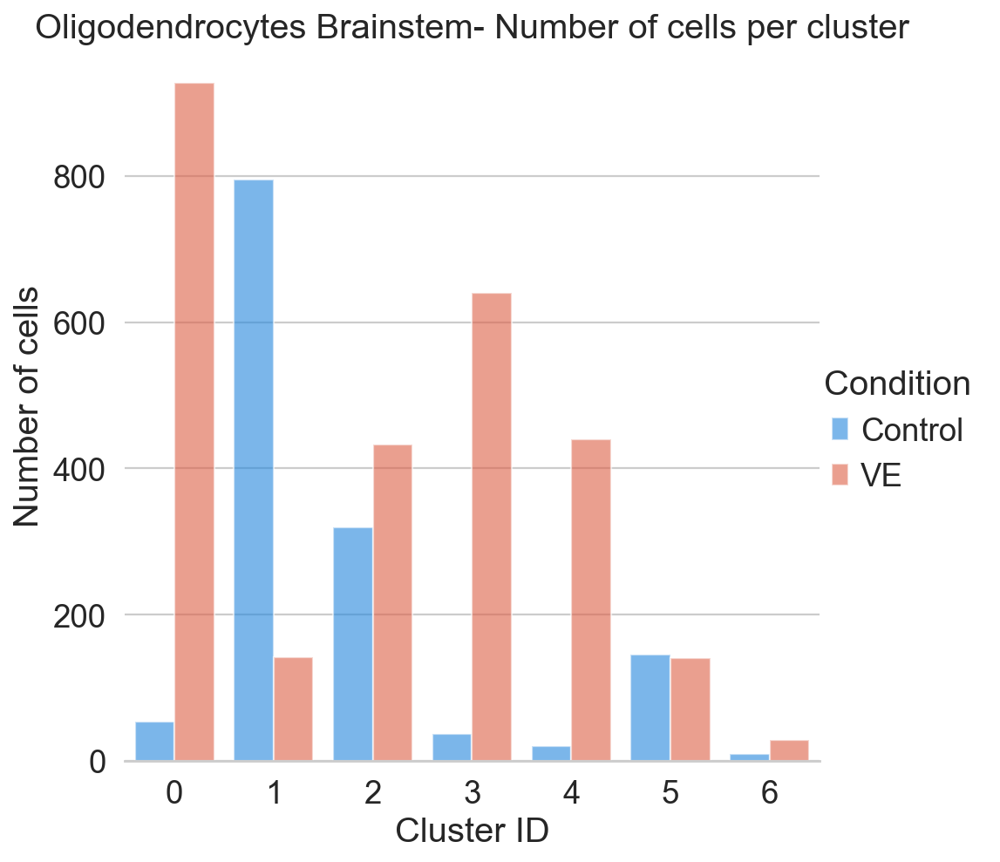

In [67]:
sns.set(font_scale=1.5, style = 'whitegrid') 
# Draw a nested barplot by species and sex
g = sns.catplot(
    data=mergedDF, kind="bar",
    x="ClusterID", y="N_cells", hue="Condition",
    ci="sd", palette=['#0488FC','#F64E2C'], alpha=.6, height=6
)
g.despine(left=True)
g.set(title='Oligodendrocytes Brainstem- Number of cells per cluster')
g.set_axis_labels("Cluster ID", "Number of cells")

# Compare Clusters 0+3+4 (VE) Versus All Controls

## T-test 

In [20]:
adata_oligo_BS_copy = adata_oligo_BS.copy()
# For loop creating a groups for pairwise comparison
adata_oligo_BS_copy.obs['groups'] = ['group_0_3_4VE' if int(i) in [0,3,4] and j == 'VE' else 'group_restCTRL' if j == 'Control' else 'Error' for i,j in zip(adata_oligo_BS_copy.obs['PhenoGraph_clusters_oligo_BS'],adata_oligo_BS_copy.obs['Condition'] )]


In [21]:
adata_oligo_BS_copy.obs.groups.value_counts()

group_0_3_4VE     2007
group_restCTRL    1380
Error              745
Name: groups, dtype: int64

In [52]:
#adata_oligo_BS_copy.obs[['groups','PhenoGraph_clusters_astro','PhenoGraph_clusters_astro_str','Condition']]

In [22]:
# select only cells that are in these 2 groups that I want to compare
adata_oligo_BS_to_compare = adata_oligo_BS_copy[[group in ['group_restCTRL', 'group_0_3_4VE'] for group in adata_oligo_BS_copy.obs['groups']],].copy()
adata_oligo_BS_to_compare.obs.groups.value_counts()

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


group_0_3_4VE     2007
group_restCTRL    1380
Name: groups, dtype: int64

... storing 'groups' as categorical


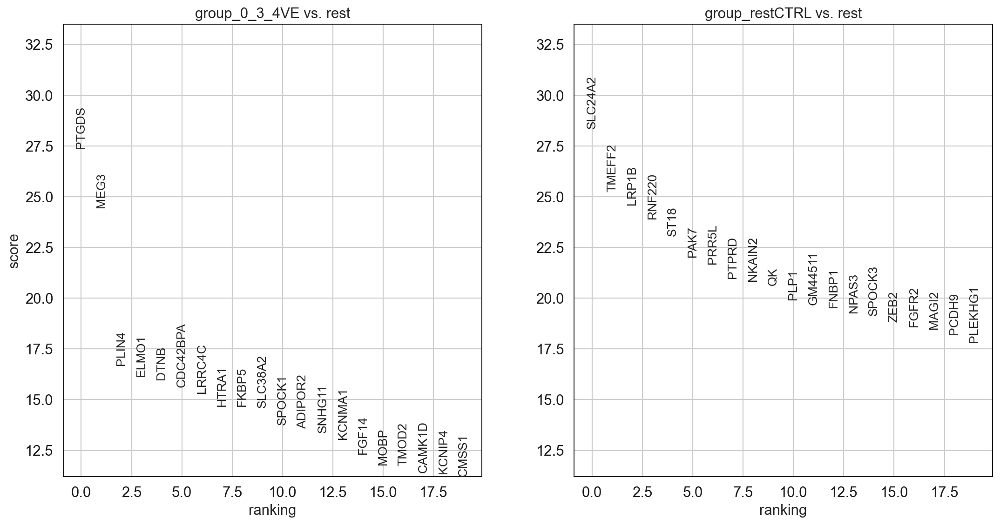

In [23]:
sc.set_figure_params(figsize=(8, 8))
key_ad = 'group_0_3_4VE'
n_genes = 100000

sc.tl.rank_genes_groups(adata_oligo_BS_to_compare, groupby='groups', key_added="group_0_3_4VE", method='wilcoxon')
sc.pl.rank_genes_groups(adata_oligo_BS_to_compare, key = 'group_0_3_4VE', fontsize=12)

result = adata_oligo_BS_to_compare.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
#pval_table.to_excel(os.path.join("/Users/fragkogs/Desktop/", key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

In [24]:
pval_table = pval_table.sort_values(by= 'group_0_3_4VE_l', ascending=False)
pval_table[(pval_table.group_0_3_4VE_p < 0.05) & (pval_table.group_0_3_4VE_l > 0.5)].head(10)

,group_0_3_4VE_n,group_0_3_4VE_l,group_0_3_4VE_p,group_restCTRL_n,group_restCTRL_l,group_restCTRL_p
2,PLIN4,4.316227,7.716070e-60,LRP1B,1.129448,4.557660e-130
0,PTGDS,3.976823,3.485803e-161,SLC24A2,1.338263,9.356319e-173
32,C4B,3.387739,2.197300e-15,ZDHHC14,1.966826,1.409475e-48
8,FKBP5,3.158829,3.375857e-46,NKAIN2,0.699956,2.585430e-93
129,CDKN1A,3.015562,2.717876e-02,CYP27A1,1.667749,6.378293e-19
77,ITIH5,2.948450,1.644069e-04,THSD7A,1.684834,7.227800e-26
23,HIF3A,2.896505,9.021122e-23,PDE4D,2.181571,8.368006e-56
31,GLI2,2.485971,5.148924e-16,TMEM178B,1.630496,9.735056e-49
4,DTNB,2.294754,8.570480e-55,ST18,1.699423,1.920479e-114
13,KCNMA1,2.230131,1.515932e-36,NPAS3,2.301111,6.484222e-80


## MAST 

In [25]:
cell_type = 'Oligodendrocytes_Brainstem_C_0_3_4'
expmat = pd.DataFrame(adata_oligo_BS_to_compare.X, columns = adata_oligo_BS_to_compare.var.index, index = adata_oligo_BS_to_compare.obs.index)
cdata = pd.DataFrame(adata_oligo_BS_to_compare.obs, columns=adata_oligo_BS_to_compare.obs.columns, index = adata_oligo_BS_to_compare.obs.index)
expmat.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv', index=True)
cdata.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv', index=True)

In [26]:
start_time = timeit.default_timer()
MAST = './runMAST_clusters.R'
expmat_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
cdata_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
output_file_cort = '../DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_RESULTS.csv" 

os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " )
out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)

In [27]:
# import the MAST results
mast_C0_3_4_res = pd.read_csv (filepath_or_buffer= '../DEA/Oligodendrocytes_Brainstem_C_0_3_4/MAST_DEA_Oligodendrocytes_Brainstem_C_0_3_4_RESULTS.csv')
print(mast_C0_3_4_res)

                gene              p      p.fdr.adj     logFC
0              PLIN4  3.560202e-108  4.694482e-104  1.365150
1              FKBP5   5.891579e-99   3.884318e-95  1.409511
2             TMEFF2   1.276588e-96   5.611030e-93 -0.862786
3            SLC24A2   1.003113e-82   3.306761e-79 -0.664870
4               DTNB   3.834924e-82   1.011346e-78  1.458843
...              ...            ...            ...       ...
13181           NGEF   9.994574e-01   9.997607e-01  0.000591
13182         PGPEP1   9.997503e-01   9.999778e-01  0.000126
13183  B230317F23RIK   1.000000e+00   1.000000e+00  0.000192
13184          LRRD1   1.000000e+00   1.000000e+00 -0.000097
13185        PLEKHG4   1.000000e+00   1.000000e+00  0.000649

[13186 rows x 4 columns]


In [74]:
#filter DE results
mast_C0_3_4_res = mast_C0_3_4_res.sort_values(by='logFC', ascending=False)
# Upregulated genes
mast_C0_3_4_res_UP = mast_C0_3_4_res[(mast_C0_3_4_res['logFC'] >=0.5) & (mast_C0_3_4_res['p.fdr.adj'] <= 0.05)]
mast_C0_3_4_res_DOWN = mast_C0_3_4_res[(mast_C0_3_4_res['logFC'] <=-0.5) & (mast_C0_3_4_res['p.fdr.adj'] <= 0.05)]
mast_C0_3_4_res_DOWN.tail(10)

,gene,p,p.fdr.adj,logFC
51,PACRG,1.626810e-30,4.125214e-28,-0.965766
60,SYTL2,3.386350e-28,7.320067e-26,-0.971029
20,ANO4,1.047472e-52,6.577128e-50,-1.014252
46,CAR2,1.005677e-32,2.821459e-30,-1.047226
33,SPOCK3,1.353510e-39,5.249230e-37,-1.067701
16,RNF220,4.109430e-59,3.187467e-56,-1.073091
24,GM44511,5.078980e-49,2.678857e-46,-1.087686
13,OPALIN,8.499553e-62,8.005365e-59,-1.128492
22,NPAS3,1.457266e-49,8.354567e-47,-1.219435
17,PAK7,5.150715e-59,3.773185e-56,-1.384014


**FOR GO**

In [78]:
mast_C0_3_4_res_UP_for_GO = mast_C0_3_4_res[(mast_C0_3_4_res['p.fdr.adj'] <= 0.05) & (mast_C0_3_4_res['logFC'] >=0.05)]
mast_C0_3_4_res_DOWN_for_GO = mast_C0_3_4_res[(mast_C0_3_4_res['p.fdr.adj'] <= 0.05) & (mast_C0_3_4_res['logFC'] <=-0.05)]


In [47]:
mast_C0_3_4_res_DOWN.sort_values(by='p.fdr.adj', ascending=True).head(10)

,gene,p,p.fdr.adj,logFC
2,TMEFF2,1.276588e-96,5.611030e-93,-0.862786
3,SLC24A2,1.003113e-82,3.306761e-79,-0.664870
6,PTPRD,3.821516e-72,7.198644e-69,-0.589824
7,ST18,1.812150e-68,2.986876e-65,-0.804830
8,FNBP1,3.047739e-67,4.465276e-64,-0.815791
11,PDE4B,1.766753e-64,1.941367e-61,-0.531657
13,OPALIN,8.499553e-62,8.005365e-59,-1.128492
14,LRP1B,4.262160e-61,3.746722e-58,-0.552510
16,RNF220,4.109430e-59,3.187467e-56,-1.073091
17,PAK7,5.150715e-59,3.773185e-56,-1.384014


## Volcano plot

In [34]:
from bioinfokit import analys, visuz

In [35]:
mast_C0_3_4_res = mast_C0_3_4_res.dropna()

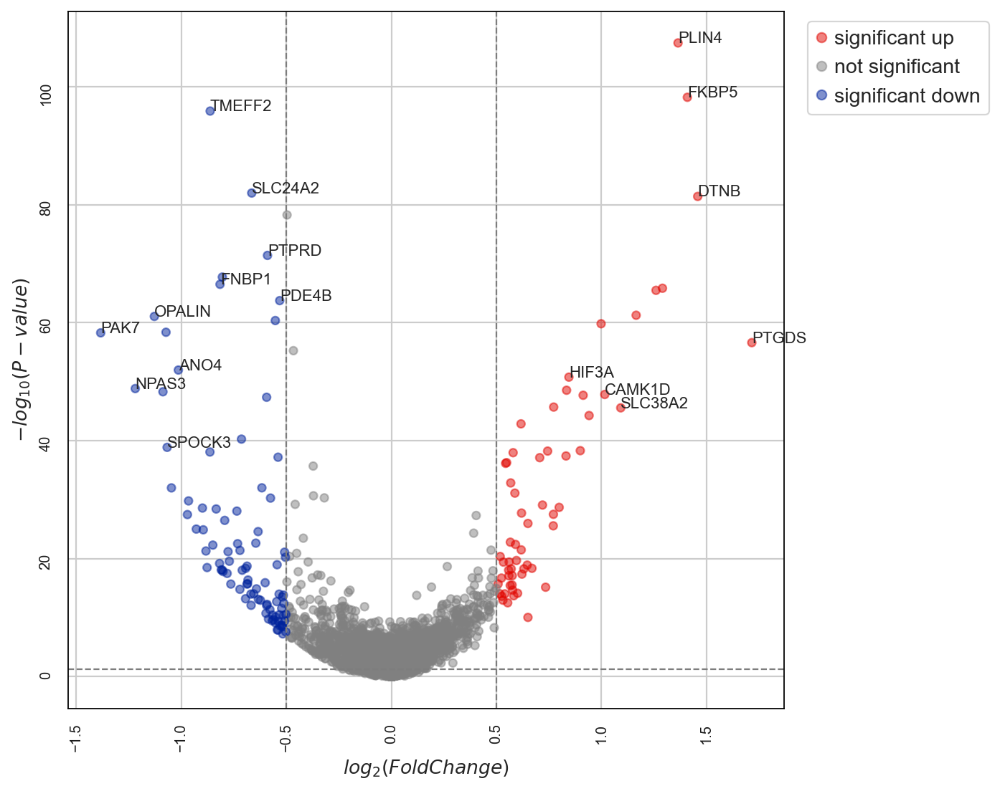

In [50]:
visuz.gene_exp.volcano(df=mast_C0_3_4_res, lfc='logFC', pv='p',show=True, plotlegend=True, legendpos='upper right', 
    legendanchor=(1.3,1),color=("#E10600FF", "grey", "#00239CFF"), valpha=0.5, dotsize=25, geneid="gene", 
                       genenames=('PTGDS', 'DTNB', 'FKBP5', 'PLIN4','SLC38A2','CAMK1D','HIF3A','PAK7','SPOCK3','OPALIN','NPAS3','ANO4','TMEFF2','SLC24A2','PTPRD','FNBP1','PDE4B'),  sign_line=True, gfont = 10, dim=(8,8), axlabelfontsize = 12, lfc_thr=(0.5, 0.5))

## HEATMAP OF TOP10 UPREGULATED GENES

In [51]:
marker_genes_dict = dict()

marker_genes_dict = {'C0_3_4_UP': mast_C0_3_4_res_UP['gene'].head(20)}

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


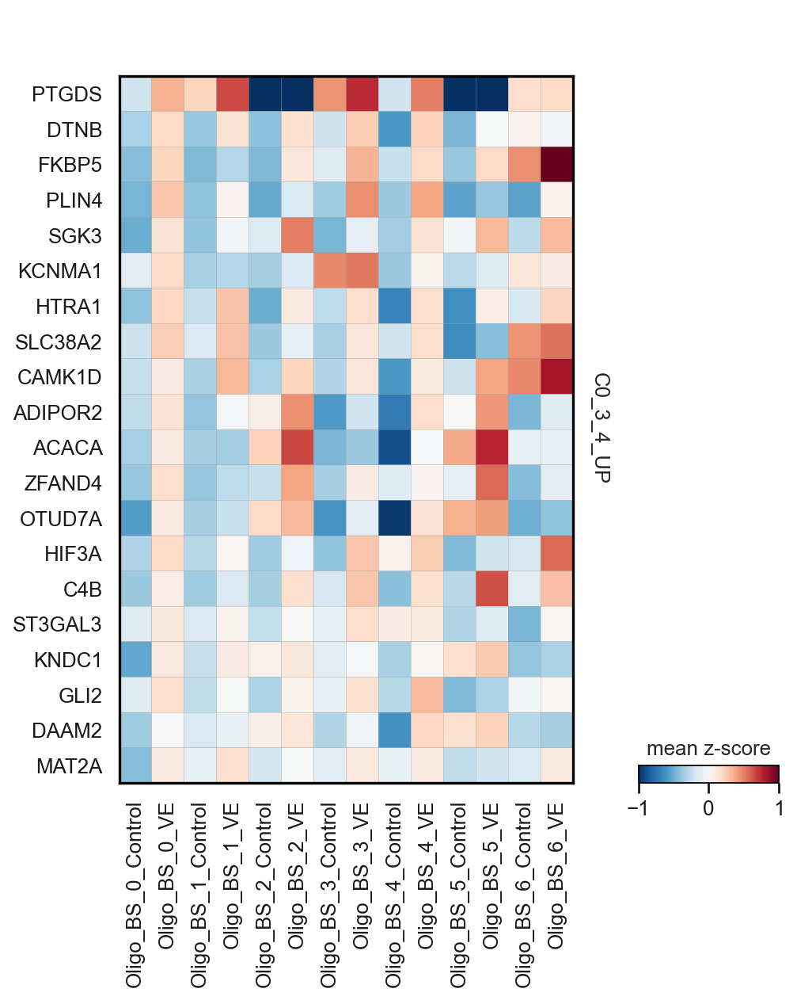

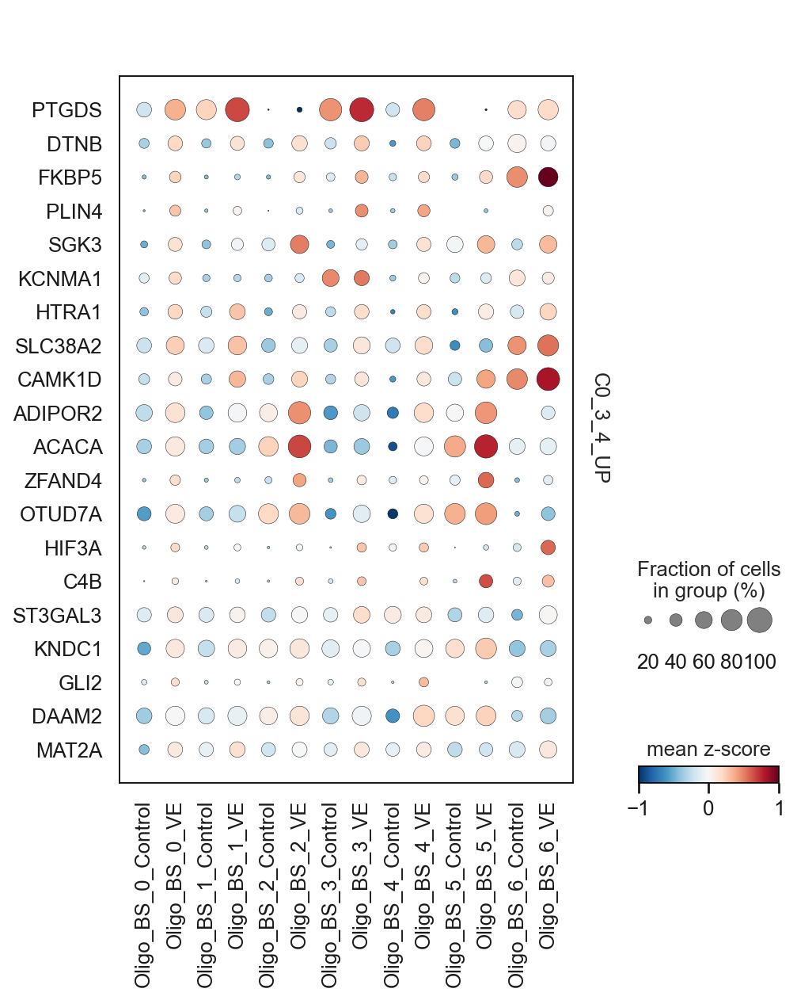

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


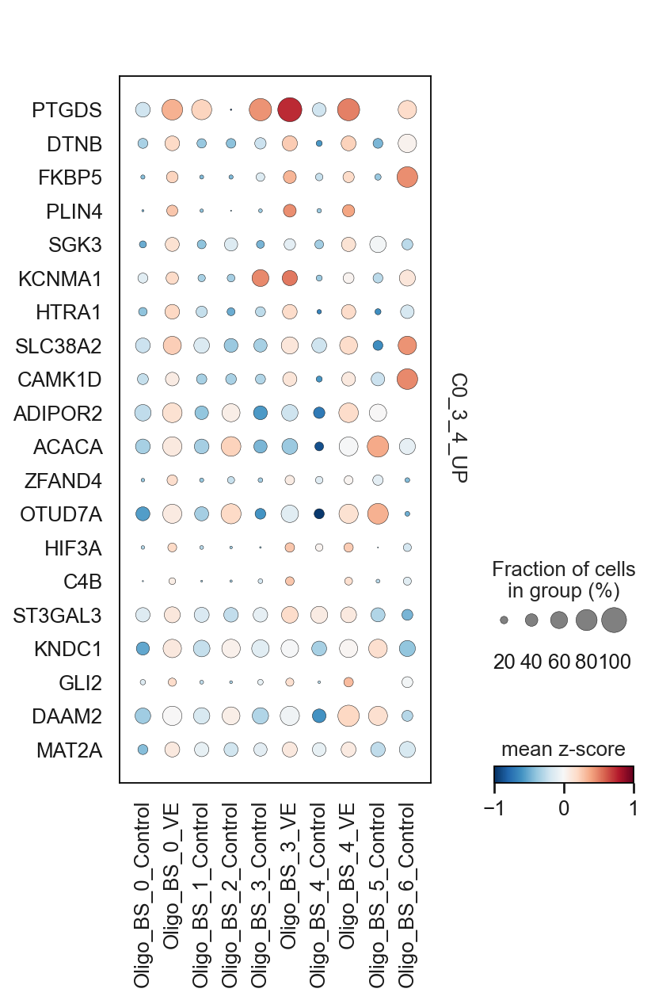

In [53]:
adata_oligo_BS.layers['scaled'] = sc.pp.scale(adata_oligo_BS, copy=True).X
sc.pl.matrixplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
                 colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS_to_compare, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

## Enricher

In [86]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
import gseapy
gene_set_names = gseapy.get_library_name(database='Mouse')
#print(gene_set_names)

mast_C0_3_4_res_n_list = mast_C0_3_4_res_DOWN_for_GO.gene.str.strip().tolist()
enr_res = gseapy.enrichr(gene_list=mast_C0_3_4_res_n_list,
                     organism='Mouse',
                     gene_sets=['KEGG_2019_Mouse'],
                     description='pathway',
                     cutoff = 0.5)

In [87]:
enr_res.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Mouse,Axon guidance,35/180,3.785395e-09,0.000001,0,0,3.564617,69.125474,SEMA5A;ITGB1;GSK3B;LRRC4;PARD6G;PIK3R1;PRKCZ;R...
1,KEGG_2019_Mouse,Focal adhesion,29/199,3.295747e-05,0.003369,0,0,2.503852,25.840482,SHC4;ITGB1;GSK3B;LAMA2;ITGB4;ITGB3;PTEN;PIK3R1...
2,KEGG_2019_Mouse,Fc gamma R-mediated phagocytosis,17/87,3.533735e-05,0.003369,0,0,3.550095,36.390500,GSN;LIMK2;PLA2G4A;PRKCA;ASAP1;GAB2;PIK3R1;PLD1...
3,KEGG_2019_Mouse,Tight junction,25/167,7.195567e-05,0.003912,0,0,2.579844,24.610317,ITGB1;PARD6G;PPP2R2A;PRKCZ;ACTB;ACTG1;EPB41L4B...
4,KEGG_2019_Mouse,Rap1 signaling pathway,29/209,8.154152e-05,0.003912,0,0,2.363473,22.250678,ITGB1;ITGB3;LPAR1;PARD6G;PIK3R1;PRKCZ;ACTB;ACT...
5,KEGG_2019_Mouse,ErbB signaling pathway,16/84,8.207530e-05,0.003912,0,0,3.437212,32.336854,SHC4;GSK3B;JUN;MAP2K2;PRKCA;PIK3R1;PTK2;BTC;MA...
6,KEGG_2019_Mouse,Glutamatergic synapse,19/114,1.228281e-04,0.005018,0,0,2.924273,26.332276,TRPC1;SLC1A2;SLC1A3;GRIK4;PLA2G4A;PRKCA;GRIK2;...
7,KEGG_2019_Mouse,cAMP signaling pathway,28/211,2.309560e-04,0.008257,0,0,2.242426,18.776466,HHIP;ATP1A3;ATP1A2;PIK3R1;ATP1A1;PLD1;PLD2;PAK...
8,KEGG_2019_Mouse,Sphingolipid signaling pathway,19/124,3.763075e-04,0.011958,0,0,2.644350,20.850972,MAP2K2;ASAH2;SGMS1;PTEN;PPP2R2A;PRKCA;PIK3R1;G...
9,KEGG_2019_Mouse,Adrenergic signaling in cardiomyocytes,21/148,5.512926e-04,0.015691,0,0,2.417348,18.137951,ATF2;ATF6B;ATP1A3;PPP2R2A;PRKCA;ATP1A2;CACNA2D...


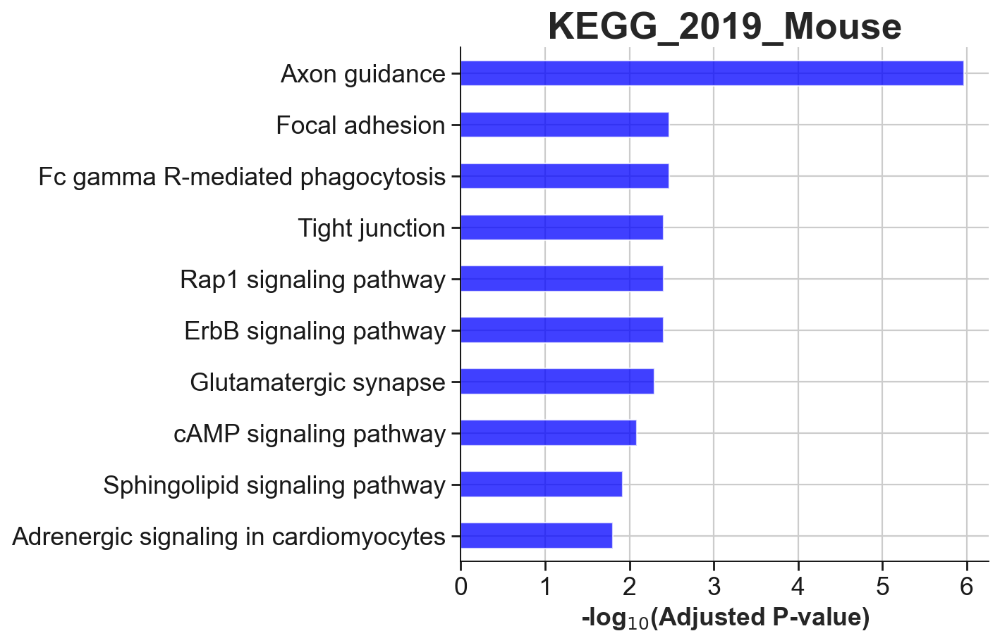

In [88]:
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Mouse',top_term=10,color='blue',figsize=(6,6))

In [ ]:
gseapy.dotplot(enr_res.res2d, title='GO_Biological_Process_2018',cmap='viridis_r', top_term=20, figsize=(6,8))

## GSEA pre-rank

In [122]:
mast_C0_1_3_4_6_res = mast_C0_1_3_4_6_res.dropna()
pval_table_rnk = mast_C0_1_3_4_6_res[['gene','logFC','p.fdr.adj']]

rank_score = pval_table_rnk['logFC'] * -np.log10(pval_table_rnk['p.fdr.adj'])
rank_score
pval_table_rnk['score'] = rank_score

In [ ]:
pval_table_rnk = pval_table_rnk.sort_values(by= 'score', ascending=False)
pval_table_rnk = pval_table_rnk[['gene', 'score']]
pval_table_rnk.head(15)

In [126]:
pre_res = gseapy.prerank(rnk=pval_table_rnk, 
                     gene_sets='MSigDB_Hallmark_2020',
                     processes=4,
                     permutation_num=100, # reduce number to speed up testing
                     outdir='../test/prerank_report_kegg', format='png', seed=6, graph_num=5)

In [ ]:
pre_res.res2d.sort_index().head(n=25).sort_values('fdr')

In [ ]:
Allen_Brain_Atlas_10x_scRNA_2021
MSigDB_Hallmark_2020
KEGG_2019_Mouse
MSigDB_Oncogenic_Signatures
Reactome_2016
WikiPathways_2019_Mouse
GO_Biological_Process_2018

In [160]:
#print(gene_set_names)

# Compare Clusters 2 + 5 (VE) Versus All Controls

## T-test 

In [128]:
adata_oligo_BS_copy = adata_oligo_BS.copy()
# For loop creating a groups for pairwise comparison
adata_oligo_BS_copy.obs['groups'] = ['group_2_5VE' if int(i) in [2,5] and j == 'VE' else 'group_restCTRL' if j == 'Control' else 'Error' for i,j in zip(adata_oligo_BS_copy.obs['PhenoGraph_clusters_oligo_BS'],adata_oligo_BS_copy.obs['Condition'] )]


In [129]:
adata_oligo_BS_copy.obs.groups.value_counts()

Error             2178
group_restCTRL    1380
group_2_5VE        574
Name: groups, dtype: int64

In [52]:
#adata_oligo_BS_copy.obs[['groups','PhenoGraph_clusters_astro','PhenoGraph_clusters_astro_str','Condition']]

In [130]:
# select only cells that are in these 2 groups that I want to compare
adata_oligo_BS_to_compare = adata_oligo_BS_copy[[group in ['group_restCTRL', 'group_2_5VE'] for group in adata_oligo_BS_copy.obs['groups']],].copy()
adata_oligo_BS_to_compare.obs.groups.value_counts()

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


group_restCTRL    1380
group_2_5VE        574
Name: groups, dtype: int64

... storing 'groups' as categorical


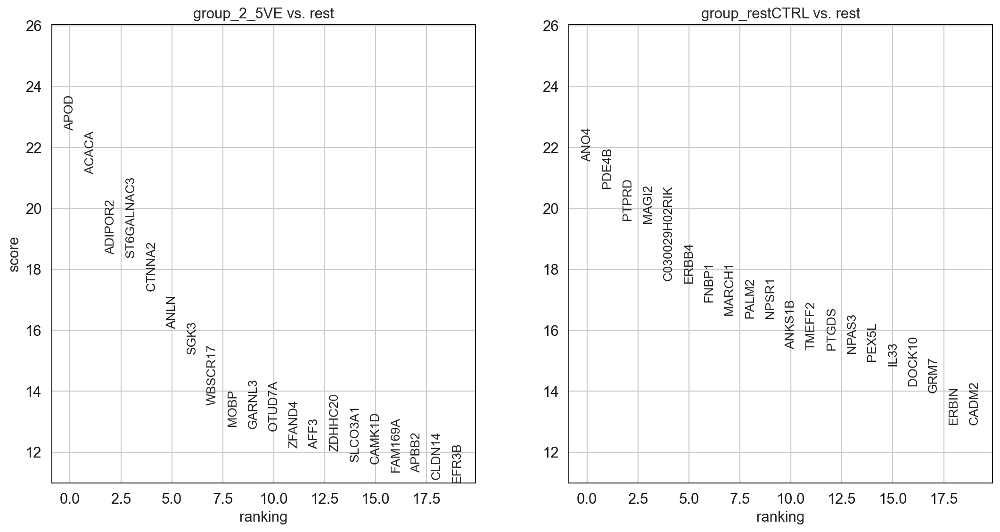

In [131]:
sc.set_figure_params(figsize=(8, 8))
key_ad = 'group_2_5VE'
n_genes = 100000

sc.tl.rank_genes_groups(adata_oligo_BS_to_compare, groupby='groups', key_added="group_2_5VE", method='wilcoxon')
sc.pl.rank_genes_groups(adata_oligo_BS_to_compare, key = 'group_2_5VE', fontsize=12)

result = adata_oligo_BS_to_compare.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
#pval_table.to_excel(os.path.join("/Users/fragkogs/Desktop/", key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

In [133]:
pval_table = pval_table.sort_values(by= 'group_2_5VE_l', ascending=False)
pval_table[(pval_table.group_2_5VE_p < 0.05) & (pval_table.group_2_5VE_l > 0.5)].head(10)

,group_2_5VE_n,group_2_5VE_l,group_2_5VE_p,group_restCTRL_n,group_restCTRL_l,group_restCTRL_p
43,C4B,3.858826,4.475200e-15,PACRG,1.967147,7.844681e-24
7,WBSCR17,3.305732,4.162719e-39,MARCH1,2.427228,3.751178e-58
16,FAM169A,3.210891,1.976642e-27,DOCK10,1.081807,7.459326e-43
193,ITIH5,3.122178,2.442101e-03,GM26694,1.097561,6.971749e-05
31,ART3,3.108725,7.621913e-21,ST18,0.879658,3.337732e-27
11,ZFAND4,3.015689,2.379821e-31,TMEFF2,1.111367,2.342335e-50
166,SCRG1,2.783830,4.647001e-04,DNAJC6,1.110856,2.362936e-06
32,FKBP5,2.781743,5.186175e-20,PCDH15,2.129147,3.712718e-27
6,SGK3,2.712264,1.853057e-49,FNBP1,1.574982,3.183828e-61
1,ACACA,2.671530,2.038585e-95,PDE4B,1.138393,2.317755e-91


## MAST 

In [134]:
cell_type = 'Oligodendrocytes_Brainstem_C2_5'
expmat = pd.DataFrame(adata_oligo_BS_to_compare.X, columns = adata_oligo_BS_to_compare.var.index, index = adata_oligo_BS_to_compare.obs.index)
cdata = pd.DataFrame(adata_oligo_BS_to_compare.obs, columns=adata_oligo_BS_to_compare.obs.columns, index = adata_oligo_BS_to_compare.obs.index)
expmat.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv', index=True)
cdata.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv', index=True)

In [137]:
start_time = timeit.default_timer()
MAST = './runMAST_clusters.R'
expmat_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
cdata_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
output_file_cort = '../DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_RESULTS.csv" 

os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " )
out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)

In [289]:
# import the MAST results
mast_C2_5_res = pd.read_csv (filepath_or_buffer= '../DEA/Oligodendrocytes_Brainstem_C2_5/MAST_DEA_Oligodendrocytes_Brainstem_C2_5_RESULTS.csv')
print(mast_C2_5_res)

                 gene              p      p.fdr.adj     logFC
0                APOD  1.030091e-135  1.358278e-131  1.599984
1               ACACA  5.051976e-128  3.330768e-124  1.789767
2                ANO4  3.921208e-121  1.723502e-117 -2.312375
3               PDE4B  1.618949e-111  5.336866e-108 -0.819195
4       C030029H02RIK  2.443899e-103  6.445050e-100 -2.118075
...               ...            ...            ...       ...
13181           HBEGF   9.992373e-01   1.000000e+00 -0.000332
13182        MIR9.3HG   9.998362e-01   1.000000e+00  0.000139
13183             MOK   9.996908e-01   1.000000e+00 -0.000167
13184  X1700008O03RIK   9.995290e-01   1.000000e+00 -0.000504
13185  X1700110C19RIK   9.998138e-01   1.000000e+00  0.000065

[13186 rows x 4 columns]


In [294]:
#filter DE results
mast_C2_5_res = mast_C2_5_res.sort_values(by='logFC', ascending=False)
# Upregulated genes
mast_C2_5_res_UP = mast_C2_5_res[(mast_C2_5_res['logFC'] >=0.5) & (mast_C2_5_res['p.fdr.adj'] <= 0.05)]
mast_C2_5_res_DOWN = mast_C2_5_res[(mast_C2_5_res['logFC'] <=-0.5) & (mast_C2_5_res['p.fdr.adj'] <= 0.05)]
mast_C2_5_res_DOWN['gene'].tail(5)

12            NPSR1
11            PALM2
4     C030029H02RIK
2              ANO4
9             PTGDS
Name: gene, dtype: object

## Volcano plot

In [250]:
from bioinfokit import analys, visuz

In [292]:
mast_C2_5_res = mast_C2_5_res.dropna()

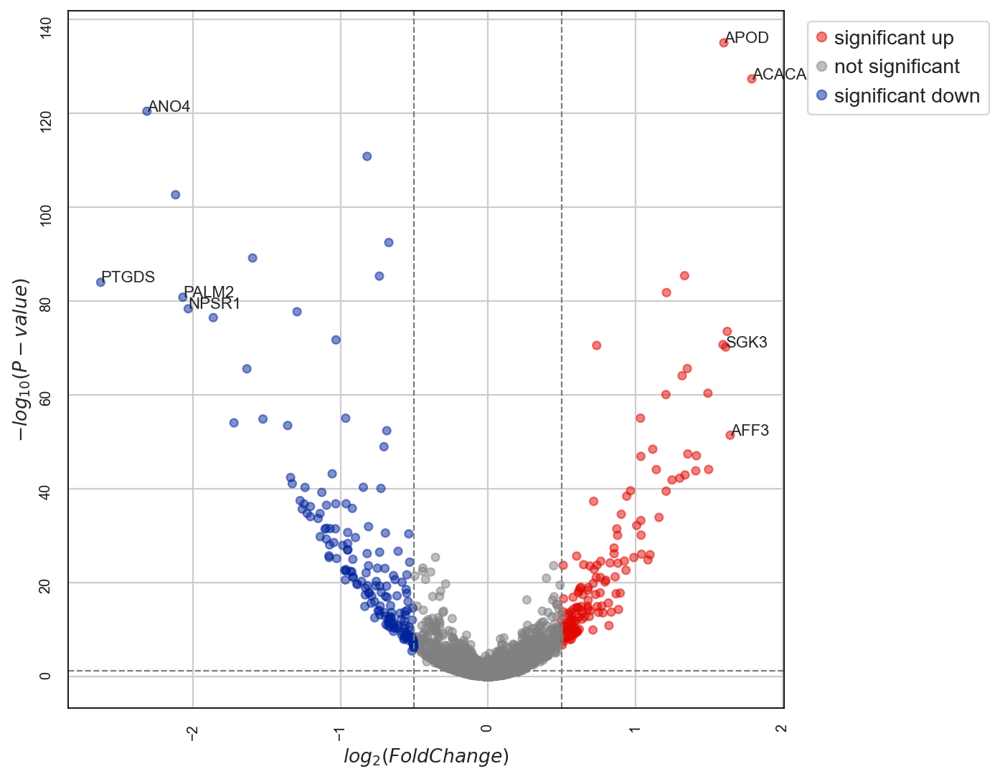

In [295]:
visuz.gene_exp.volcano(df=mast_C2_5_res, lfc='logFC', pv='p',show=True, plotlegend=True, legendpos='upper right', 
    legendanchor=(1.3,1),color=("#E10600FF", "grey", "#00239CFF"), valpha=0.5, dotsize=25, geneid="gene", 
                       genenames=('ACACA', 'AFF3', 'SGK3', 'APOD','NPSR1','PALM2','ANO4','PTGDS'),  sign_line=True, gfont = 10, dim=(8,8), axlabelfontsize = 12, lfc_thr=(0.5, 0.5))

## HEATMAP OF TOP10 UPREGULATED GENES

In [146]:
marker_genes_dict = dict()

marker_genes_dict = {'C2_5': mast_C2_5_res['gene'].head(20)}

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/scanpy/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


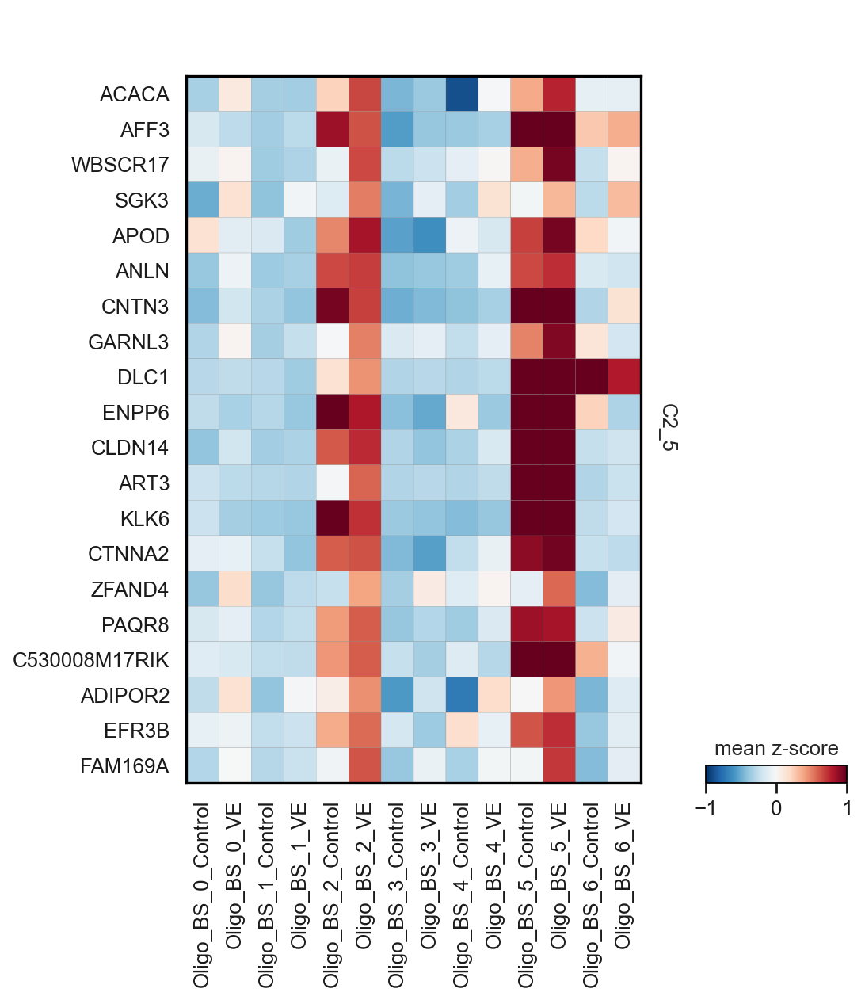

categories: Oligo_BS_0_Control, Oligo_BS_0_VE, Oligo_BS_1_Control, etc.
var_group_labels: C2_5


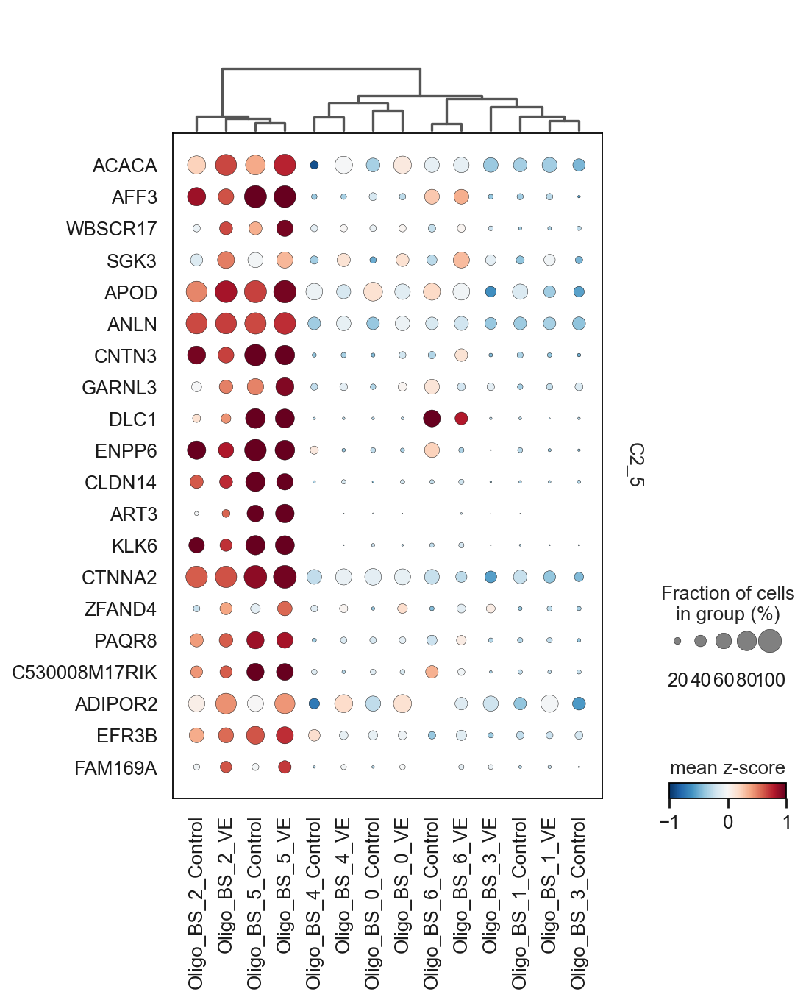

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


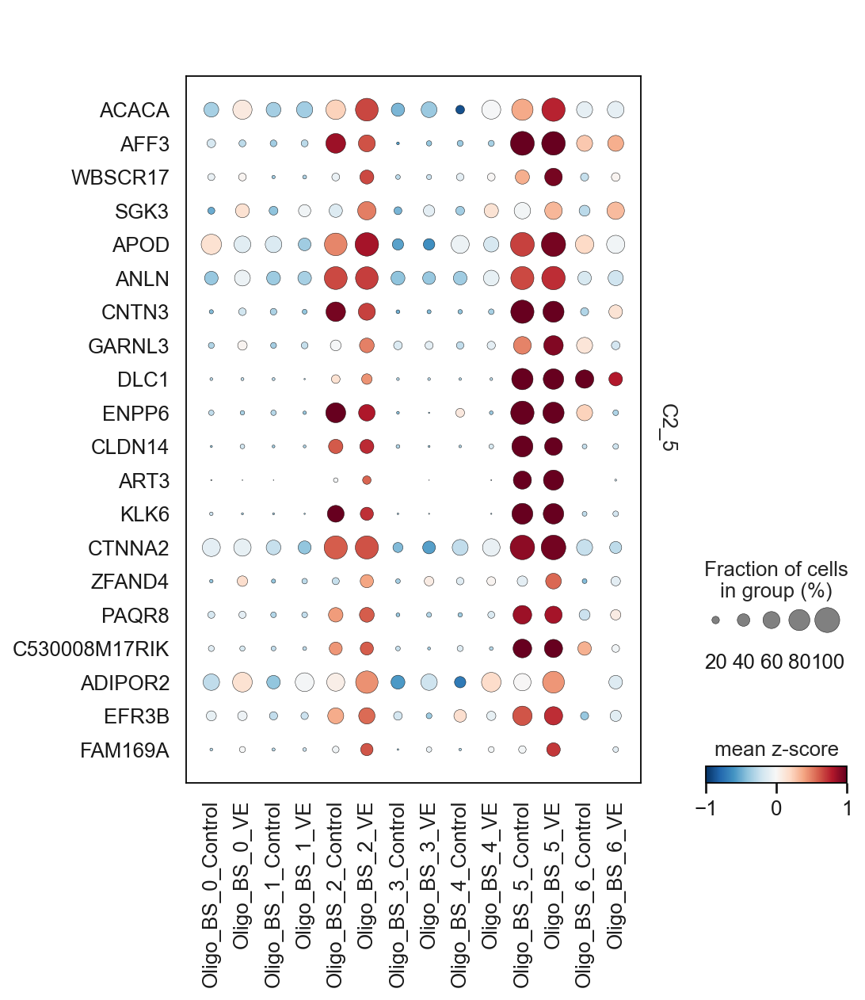

In [147]:
adata_oligo_BS.layers['scaled'] = sc.pp.scale(adata_oligo_BS, copy=True).X
sc.pl.matrixplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
                 colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=True,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_oligo_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
             colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

## Enricher

In [156]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
import gseapy
gene_set_names = gseapy.get_library_name(database='Mouse')
#print(gene_set_names)

mast_C2_5_res_n_list = mast_C2_5_res_DOWN.gene.str.strip().tolist()
enr_res = gseapy.enrichr(gene_list=mast_C2_5_res_n_list,
                     organism='Mouse',
                     gene_sets=['KEGG_2019_Mouse'],
                     description='pathway',
                     cutoff = 0.5)

In [157]:
enr_res.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Mouse,Axon guidance,24/180,9.500974e-09,0.000002,0,0,4.537278,83.812018,ITGB1;EPHA4;GSK3B;EPHA6;SEMA6A;SEMA3C;UNC5B;DC...
1,KEGG_2019_Mouse,Focal adhesion,17/199,4.289508e-04,0.051561,0,0,2.721729,21.104743,SHC4;ITGB1;GSK3B;LAMA2;PIK3R1;PARVB;THBS2;ACTB...
2,KEGG_2019_Mouse,Proximal tubule bicarbonate reclamation,5/22,6.998324e-04,0.051561,0,0,8.488965,61.669528,CAR2;ATP1A3;ATP1A2;ATP1A1;ATP1B1
3,KEGG_2019_Mouse,Bacterial invasion of epithelial cells,9/74,8.316365e-04,0.051561,0,0,4.010388,28.442130,ITGB1;DNM3;SHC4;PIK3R1;DOCK1;ACTB;PTK2;BCAR1;A...
4,KEGG_2019_Mouse,Rap1 signaling pathway,16/209,1.987220e-03,0.098566,0,0,2.410571,14.996204,MAGI1;ITGB1;DOCK4;MAGI2;PARD6G;PIK3R1;PRKCZ;AC...
5,KEGG_2019_Mouse,Arrhythmogenic right ventricular cardiomyopath...,8/72,2.859253e-03,0.102127,0,0,3.615240,21.175167,ITGB1;CACNB4;CDH2;LAMA2;CACNA2D3;CACNA2D4;ACTB...
6,KEGG_2019_Mouse,Hippo signaling pathway,13/159,2.882611e-03,0.102127,0,0,2.583674,15.112058,GSK3B;PARD6G;PPP2R2A;PRKCZ;ACTB;ACTG1;SMAD7;TG...
7,KEGG_2019_Mouse,PI3K-Akt signaling pathway,22/357,5.007344e-03,0.136761,0,0,1.912838,10.132013,MAGI1;ITGB1;GSK3B;HSP90AA1;PHLPP1;ATF6B;LAMA2;...
8,KEGG_2019_Mouse,Glutamatergic synapse,10/114,5.187002e-03,0.136761,0,0,2.783538,14.645862,GRM3;GRM5;GRM7;GNG7;SLC1A2;GRIK3;GRIK1;GRIK2;G...
9,KEGG_2019_Mouse,Thyroid hormone signaling pathway,10/115,5.514572e-03,0.136761,0,0,2.756885,14.336796,GSK3B;HDAC3;THRA;ATP1A3;ATP1A2;PIK3R1;ATP1A1;A...


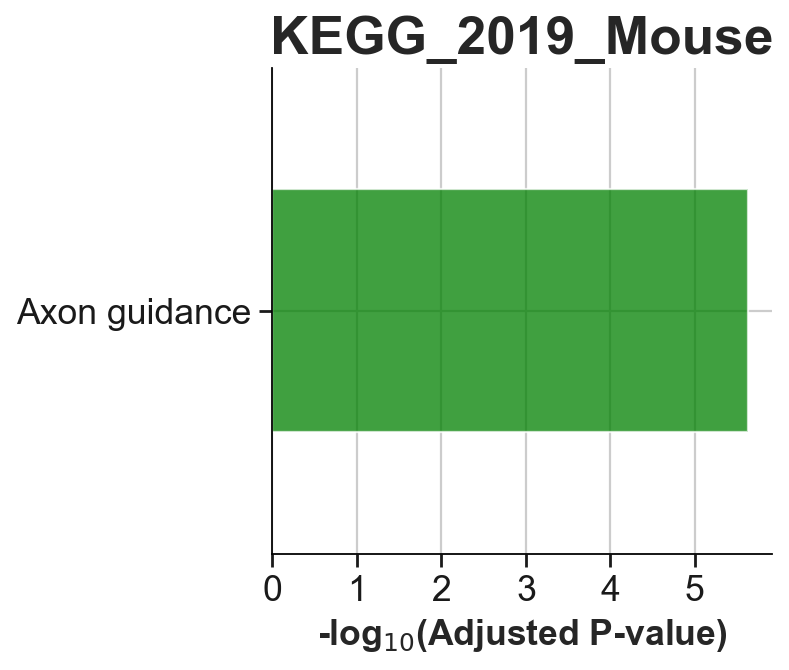

In [158]:
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Mouse',top_term=20,color='green',figsize=(4,4))

In [ ]:
gseapy.dotplot(enr_res.res2d, title='WikiPathways_2019_Mouse',cmap='viridis_r', top_term=20, figsize=(6,8))

# Whole Brain analysis

In [27]:
WB_up = df = pd.read_csv(filepath_or_buffer= '../WholeBrain_Data/Whole_brain_UP.txt', delimiter = "\t")
print(WB_up)

      GeneName
0          FGR
1        ITGAL
2         SCIN
3         SELE
4          CD4
..         ...
313      FCGBP
314     PIK3R6
315  LINC00706
316  PACRG-AS1
317    SLC35D2

[318 rows x 1 columns]


In [28]:
WB_down = df = pd.read_csv(filepath_or_buffer= '../WholeBrain_Data/Whole_brain_DOWN.txt', delimiter = "\t")
print(WB_down)

    GeneName
0        NRK
1    PPP1R17
2     CLEC4G
3      CALB1
4       COMP
..       ...
95    FRMPD2
96      VAX2
97      ENO3
98  TP53AIP1
99   TMEM63C

[100 rows x 1 columns]


In [29]:
inter_up = adata_oligo_BS[:, adata_oligo_BS.var_names.isin(WB_up['GeneName'])].copy()
inter_down = adata_oligo_BS[:, adata_oligo_BS.var_names.isin(WB_down['GeneName'])].copy()

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [30]:
WB_up_dict = dict()

WB_up_dict = {'WB_up': inter_up.var_names[1:50]}
WB_up_dict

{'WB_up': Index(['SPI1', 'ST8SIA6', 'CD33', 'KCNQ1', 'NCF1', 'FLI1', 'ABI3', 'IKZF1',
        'PLEK', 'DOCK2', 'PIK3R5', 'PRKCH', 'LY86', 'SYK', 'ELOVL7', 'ERBIN',
        'SLA', 'NCKAP1L', 'SAMSN1', 'CD86', 'RUNX1', 'TREM2', 'FGD2', 'FKBP5',
        'MYO1F', 'LAMA3', 'CSF1R', 'PAPSS2', 'PIK3AP1', 'PODXL', 'ITGB1',
        'IL1R1', 'IL1R2', 'SLC11A1', 'PTPRC', 'NCF2', 'APBB1IP', 'NFATC2',
        'MECOM', 'DAPP1', 'LAPTM5', 'TNFRSF1B', 'SPOCD1', 'CSF3R', 'FGR',
        'ABCG2', 'ARHGDIB', 'CTSC', 'TYROBP'],
       dtype='object')}

In [ ]:
sc.set_figure_params(figsize=(8, 8))
inter_up.layers['scaled'] = sc.pp.scale(inter_up, copy=True).X
sc.pl.matrixplot(inter_up, WB_up_dict, groupby=['PhenoGraph_clusters_oligo_BS_str','Condition'], dendrogram=False,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True)


In [33]:
# import the MAST results
adata_oligo_BS_res = pd.read_csv (filepath_or_buffer= '../DEA/Oligodendrocytes_Brainstem/MAST_DEA_Oligodendrocytes_RESULTS.csv')
#filter DE results
adata_oligo_BS_res = adata_oligo_BS_res.sort_values(by='logFC', ascending=False)
adata_oligo_BS_res_sig = adata_oligo_BS_res[adata_oligo_BS_res['p.fdr.adj'] <= 0.05]

**Upregulated**

In [34]:
adata_oligo_BS_res_sig['gene'].isin(inter_up.var_names).value_counts()

False    4648
True       21
Name: gene, dtype: int64

In [35]:
adata_oligo_BS_res_sig[adata_oligo_BS_res_sig['gene'].isin(inter_up.var_names)].head(10)

,gene,p,p.fdr.adj,logFC
1,FKBP5,1.166821e-108,7.692853e-105,1.245794
1198,LHFPL3,8.748501e-06,9.621162e-05,0.195643
2018,LAT2,2.138926e-04,1.396923e-03,0.049376
1433,C1QB,2.494868e-05,2.290900e-04,0.045310
2377,CTSS,5.437080e-04,3.013768e-03,0.042999
2875,DOCK2,1.487696e-03,6.819255e-03,0.041494
2070,CSF1R,2.516547e-04,1.602278e-03,0.041254
2594,MYO1F,8.566677e-04,4.352994e-03,0.028851
3977,PTPRC,7.702718e-03,2.553408e-02,0.025664
2132,RUNX1,2.986175e-04,1.845405e-03,0.025062


**Downregulated**

In [36]:
adata_oligo_BS_res_sig['gene'].isin(inter_down.var_names).value_counts() 

False    4662
True        7
Name: gene, dtype: int64

In [37]:
adata_oligo_BS_res_sig[adata_oligo_BS_res_sig['gene'].isin(inter_down.var_names)].head(10)

,gene,p,p.fdr.adj,logFC
1070,RAB37,3.766415e-06,4.637157e-05,0.217662
3072,INPP5J,2.065321e-03,8.854885e-03,0.092316
3479,PVALB,3.898241e-03,1.477075e-02,0.062684
4097,TTC9B,9.000524e-03,2.896069e-02,0.022524
4191,ARC,1.007633e-02,3.169525e-02,-0.033486
102,GRID2,2.249887e-26,2.880292e-24,-0.624592
120,ADAMTSL1,2.405600e-23,2.621508e-21,-0.696806
